# 1. Libraries

In [109]:
import pandas as pd
import os
import math
import numpy as np
from math import radians, sqrt
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
import re
from langdetect import detect

#libraries for data visualization
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import osmnx as ox
from wordcloud import WordCloud

#for statistical modeling
from sklearn.model_selection import train_test_split
from sklearn.dummy import DummyRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
import lightgbm as ltb
from xgboost import XGBRegressor
from sklearn.feature_extraction.text import TfidfVectorizer

#for model evaluation
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV
import shap
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler

import pickle

# 2. File upload

In [2]:
#avoiding scientific numbers format, and display all the columns and rows
pd.set_option('display.float_format', lambda x: '%.2f' % x)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

#Cheking the csv file size before openning it

file_path = r'F:\Ferreira.v.g - 06_06_2023\Inscrições trabalhos\Inscrição Indicium\[LH 2024-4] Desafio de Ciência de Dados\teste_indicium_precificacao.csv'
if os.path.exists(file_path):
    file_size_Mb = os.path.getsize(file_path) / 1048576
    print(f"File Size (Mb) = {file_size_Mb}")
          
else:
    print("File does not exist.")

File Size (Mb) = 6.749670028686523


In [3]:
#Openning the csv file

df = pd.read_csv(file_path)
df.head()

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
0,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75,-73.98,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
1,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.81,-73.94,Private room,150,3,0,NaN,NaN,1,365
2,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.69,-73.96,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
3,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.80,-73.94,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
4,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.75,-73.97,Entire home/apt,200,3,74,2019-06-22,0.59,1,129


# 3. Defined Functions

In [4]:
def single_var(df, cols):
    number_cols = len(cols)
    number_lines = math.ceil(number_cols / 3)

    fig, axes = plt.subplots(number_lines, 3, figsize=(16, 4 * number_lines))  # Create subplots
    
    for i, col in enumerate(cols):
        row = i // 3  # to calculate the row number for the subplot
        col_index = i % 3   # to calculate the column number for the subplot
        
        ax = axes[row, col_index] if number_lines > 1 else axes[col_index]  # Select the specific subplot for each graph
        
        if df[col].dtype != 'object':
            counts = df[col].nunique()
            df[col].hist(bins=30, ax=ax)
            ax.set_xlabel(col)
            ax.set_ylabel('Count')
            ax.set_title('Distribution of ' + col)
            
            # Show count labels on top of each bar for histograms with fewer than 10 bars
            if counts < 10:
                for rect in ax.patches:
                    height = rect.get_height()
                    ax.annotate(f'{int(height)}', xy=(rect.get_x() + rect.get_width() / 2, height),
                                xytext=(0, 3), textcoords="offset points", ha='center', va='bottom')
        else:
            counts = df[col].value_counts()
            counts.plot(kind='bar', ax=ax)
            ax.set_xlabel(col)
            ax.set_ylabel('Count')
            ax.set_title('Distribution of ' + col)
            
            # Show count labels on top of each bar for graphs with fewer than 10 bars
            if len(counts) < 10:
                for idx, value in enumerate(counts):
                    ax.text(idx, value + 0.1, str(value), ha='center', va='bottom')
    
    plt.tight_layout()
    plt.show()

In [5]:
def detect_english_and_special(text):
    try:
        lang = detect(text)
        # Check if the detected language is English
        if lang != 'en':
            return False
        # Check for special characters
        if not re.match("^[a-zA-Z0-9_ ]*$", text):
            return False
        return True
    except:
        return False

In [6]:
def two_var(df, cols, var, hue):
    number_cols = len(cols)
    number_lines = math.ceil(number_cols / 3)

    fig, axes = plt.subplots(number_lines, 3, figsize=(18, 3 * number_lines)) # Subplots
    
    for i, col in enumerate(cols):
        row = i // 3  # Calculate the subplot rows 
        col_index = i % 3   # Calculate the number of columns
        
        ax = axes[row, col_index] if number_lines > 1 else axes[col_index]  # Placing the subplots

        # Check if the column has less than 10 unique values and is categorical
        if len(df[col].unique()) < 10 and df[col].dtype == 'object':
            sns.boxplot(data=df, x=col, y=var, hue=hue, width=0.6, linewidth=1.5, notch=True, fliersize=5, saturation=0.7, showfliers=False, ax=ax)
       
        # Check if the column is numerical and has only two unique values (boolean)
        elif df[col].dtype in ['int32', 'float64'] and len(df[col].unique()) == 2:
            sns.boxplot(data=df, x=col, y=var, hue=hue, width=0.6, linewidth=1.5, notch=True, fliersize=5, saturation=0.7, showfliers=False, ax=ax)
        else:
            # For continuous or categorical columns with more than 10 unique values, use scatterplot
            sns.scatterplot(data=df, x=col, y=var, hue=hue, ax=ax)
        
        ax.set_xlabel(col)
        ax.set_ylabel(var)
        ax.set_title(f'Boxplot of {var} for {col}' if len(df[col].unique()) < 10 and df[col].dtype == 'object' else f'Scatterplot of {var} for {col}')
    
    plt.tight_layout()
    plt.show()

In [7]:
def singleboxplot(df, x, y, hue):
    plt.figure(figsize=(6, 3))
    sns.boxplot(x=x, y=y, hue=hue, data=df)
    plt.title(f'{y} distristibution per {x}')
    plt.xlabel(x)
    plt.ylabel(y)
    plt.show()

In [8]:
def simple_distance(lat1, lon1, lat2, lon2):
    # Approximate 1 degree to be 111 kilometers
    lat_diff_km = abs(lat2 - lat1) * 111
    lon_diff_km = abs(lon2 - lon1) * 111

    # Calculate the Euclidean distance
    distance = sqrt(lat_diff_km**2 + lon_diff_km**2)

    return distance

#Obs.: here i considered 1 degree to be 111km. it is not exact, but a good approximation. I also used euclidean distance,
#as it is in the same city, so the globe curvature should not affect too much.


In [9]:
def preprocess_text(text):
    tokens = word_tokenize(text.lower())  #tokenize
    tokens = [word for word in tokens if word.isalpha()]  #remove non alphabetic characteres
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]  # Remove stopwords
    stemmer = PorterStemmer()
    tokens = [stemmer.stem(word) for word in tokens]
    return tokens

In [10]:
def metrics(model):
  metrics = {}
  real = y_test 
  predicted = model.predict(X_test) 

  MSE = mean_squared_error(real, predicted) #Mean squared error 
  RMSE = np.sqrt(MSE.mean()) #rooted mean squared error --> rooted square from MSE, it means that is in the same unit as the variable predicted, therefore, a good metric
  MAE = mean_absolute_error(real, predicted) #The best metric, since it states the difference between the predicted and the real 'price'.
  MAPE = (MAE/(np.mean(real)))*100 #mean absolute error in percentage. Turns easiear to see the difference between the predicted and the real value
  r2 = r2_score(real, predicted) #indicates the proportion of the variance in the dependent variable that is predictable from the model. The closer to 1, the higher the proportion predictable by the model
  metrics['MSE'] = round(MSE, 2)
  metrics['RMSE'] = round(RMSE, 2)
  metrics['MAE'] = round(MAE, 2)
  metrics['MAPE'] = round(MAPE, 2)
  metrics['r2'] = round(r2, 2)
  return metrics

In [11]:
def plot_result(model):
    eval_df = pd.DataFrame(y_test)
    eval_df['predicted'] = model.predict(X_test) 
    fig, (ax) = plt.subplots(1, figsize=(25,5))
    sns.scatterplot(x='real_price', y='predicted', data=eval_df, ax=ax)
    ax.set_ylabel('Predicted price')
    ax.set_xlabel('Real price')
    ax.set_title('Predicted vs. real price')
    ax.axline((0, 0), slope=1, color="k", linestyle=(0, (5, 5)))
    ax.legend(['predicted', 'slope 1 line - perfect prediction'])
    ax.set_xlim(0, 800)
    ax.set_ylim(0, 800)

    plt.show()

# 4. EDA

## 4.1 Cheking the CSV structure

In [12]:
df.describe()

,id,host_id,latitude,longitude,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
count,48894.00,48894.00,48894.00,48894.00,48894.00,48894.00,48894.00,38842.00,48894.00,48894.00
mean,19017532.13,67621393.58,40.73,-73.95,152.72,7.03,23.27,1.37,7.14,112.78
std,10982884.05,78611176.15,0.05,0.05,240.16,20.51,44.55,1.68,32.95,131.62
min,2595.00,2438.00,40.50,-74.24,0.00,1.00,0.00,0.01,1.00,0.00
25%,9472370.75,7822736.75,40.69,-73.98,69.00,1.00,1.00,0.19,1.00,0.00
50%,19677431.50,30795529.00,40.72,-73.96,106.00,3.00,5.00,0.72,1.00,45.00
75%,29152249.25,107434423.00,40.76,-73.94,175.00,5.00,24.00,2.02,2.00,227.00
max,36487245.00,274321313.00,40.91,-73.71,10000.00,1250.00,629.00,58.50,327.00,365.00


In [13]:
df.dtypes

id                                 int64
nome                              object
host_id                            int64
host_name                         object
bairro_group                      object
bairro                            object
latitude                         float64
longitude                        float64
room_type                         object
price                              int64
minimo_noites                      int64
numero_de_reviews                  int64
ultima_review                     object
reviews_por_mes                  float64
calculado_host_listings_count      int64
disponibilidade_365                int64
dtype: object

In [14]:
df = df.rename(columns={'price': 'real_price'})

In [15]:
#improving date datatype
df['ultima_review'] = pd.to_datetime(df['ultima_review']) #transforming the dates to datetime format

#separating data input
df['last_review_year'] = df['ultima_review'].dt.year
df['last_review_month'] = df['ultima_review'].dt.month

In [16]:
#Checking for duplicates

duplicated_rows_df = df[df.duplicated()]  #for duplicated rows
print("number of duplicated rows in df: ", duplicated_rows_df.shape)

#for duplicated IDs
print("number of duplicated IDs in df: ", df.duplicated('id').sum())

number of duplicated rows in df:  (0, 18)
number of duplicated IDs in df:  0


In [17]:
zeros_count = (df==0).sum() #is there 0s in the columns?
print(zeros_count)

id                                   0
nome                                 0
host_id                              0
host_name                            0
bairro_group                         0
bairro                               0
latitude                             0
longitude                            0
room_type                            0
real_price                          11
minimo_noites                        0
numero_de_reviews                10052
ultima_review                        0
reviews_por_mes                      0
calculado_host_listings_count        0
disponibilidade_365              17533
last_review_year                     0
last_review_month                    0
dtype: int64


In [18]:
nan_count = df.isna().sum() #Verifying NaN values in columns
print(nan_count)

id                                   0
nome                                16
host_id                              0
host_name                           21
bairro_group                         0
bairro                               0
latitude                             0
longitude                            0
room_type                            0
real_price                           0
minimo_noites                        0
numero_de_reviews                    0
ultima_review                    10052
reviews_por_mes                  10052
calculado_host_listings_count        0
disponibilidade_365                  0
last_review_year                 10052
last_review_month                10052
dtype: int64


In [19]:
#checking if host_id can be attributed to more than one host_name (i.e: the host could use the same id to multiple accounts)
duplicate_names_per_id = df.groupby('host_id')['host_name'].nunique() > 1

if duplicate_names_per_id.any():
    print("There are host_ids attributed to different names")
else:
    print("Each Host_id is attributed to a single name")

Each Host_id is attributed to a single name


In [20]:
#Checking if there are namesake (i.e: people with same name, but different accounts)
duplicate_host_names = df.groupby('host_name')['host_id'].nunique() > 1

if duplicate_host_names.any():
    print("There are some Host_names with more than one id")
else:
    print("Each Host_name is attributed to a single id")

There are some Host_names with more than one id


In [21]:
#Checking the number of namesake
print(f'The number of namesake hosts are: {duplicate_host_names.sum()}')

The number of namesake hosts are: 3125


#### From the above information we can conclude:

- The file size is low, so it can be run locally (without the need of using chunks)
- The number of samples = 48894 
- There are no duplicated rows or ids (host ids can be duplicated, as they can have more than one rental each)
- The mean price of the rentals is about 150 dollars, with 75% of them bellow 175 dollars a night.
- Several rentals have no review, that could mean they are rarelly booked
- There are rentals with no price listed, so we can exclude them
- There are several listings with no reservation dates. That could mean the host is no longer renting, or that the rental is full booked. We need to verify that before exclude these samples (for example full booked rentals probably have more than one review at least).
- There are a few listings with no title on the advertisement, so we can exclude them from the analysis
- There are listings with no 'host_name', which could be considered incomplete accounts, so we can drop them 
- Each host_id is unique, meaning that people cannot have more then one host_name for each id (safety check)
- We already have host_id information, so we don't actually need their names, particularly because there are some namesakes. They could be a) same person with different accounts; or b) people with the same name, like "João" in Brazil. Therefore, we can exclude the column host_name

## 4.2 Data filtering based on initial considerations

In [22]:
#applying the initial filters

df_filtered = df[df['real_price'] != 0]
df_filtered = df_filtered[df_filtered['nome'].notna()]
df_filtered = df_filtered[df_filtered['host_name'].notna()]
df_filtered = df_filtered.drop('host_name', axis=1)

#handle nan values
columns_to_fill_zero = ['ultima_review', 'reviews_por_mes', 'last_review_year', 'last_review_month']
df_filtered[columns_to_fill_zero] = df_filtered[columns_to_fill_zero].fillna(0)

df_filtered.shape

(48846, 17)

In [23]:
#Verifying the reservation availability 

df_full_booked = df_filtered[df_filtered['disponibilidade_365'] == 0]
df_full_booked_noreviews = df_full_booked[df_full_booked['numero_de_reviews'] == 0]
print(f"The number of rentals with no availability, but no reviews is {df_full_booked_noreviews['id'].count()}")

The number of rentals with no availability, but no reviews is 4832


- Therefore, there are 4836 rentals with no availability, and no reviews, which indicates that these rentals are probably not active (or never were) and the prices could be out-dated. We can exclude those advertisements to avoid errors in price calculations due to out-dated prices.

- However, having a review does not mean the rental is active. It could have been active some time ago, but the host withdraw the rental nowadays. So we can check for the last review date.

In [24]:
#excluding rentals with no availability and no review
df_filtered = df_filtered[(df_filtered['disponibilidade_365'] != 0) | (df_filtered['numero_de_reviews'] != 0)]
df_filtered.shape

(44014, 17)

In [25]:
#checking the last review year in the complete df
count_by_year = df_filtered.groupby(df_filtered['last_review_year'])['ultima_review'].count()
count_by_year

last_review_year
0.00        5204
2011.00        7
2012.00       25
2013.00       48
2014.00      199
2015.00     1388
2016.00     2703
2017.00     3202
2018.00     6044
2019.00    25194
Name: ultima_review, dtype: int64

In [26]:
#Now checking the last review year for the rentals with no availability
df_full_booked_2 = df_filtered[df_filtered['disponibilidade_365'] == 0]
df_full_booked_last_review = df_full_booked_2.groupby(df_full_booked_2['last_review_year'])['ultima_review'].count()
df_full_booked_last_review

last_review_year
2011.00       3
2012.00      10
2013.00      25
2014.00     147
2015.00    1207
2016.00    2320
2017.00    2528
2018.00    3348
2019.00    3085
Name: ultima_review, dtype: int64

- Many of the rentals with no availability have very old last reviews. It indicates that some rentals with no availability are probably not for rental for some time already.

- Fisrt, we will exclude the rentals that are not available, and the last review is from 2017 and older. 
- After that, we can expeculate the reason why some rentals are listed as available, but have the last review more than 2 years before the dataset date. It could be because it has a high value, so it is rarely booked, could be that the listing was withdrawed for some time and is listed again now, or even that it has only a few dates on which is available.

In [27]:
df_filtered = df_filtered[(df_filtered['disponibilidade_365'] != 0) | (df_filtered['last_review_year'] > 2017)]
df_filtered.shape

(37774, 17)

## 4.3 Data distribution and correlations
Now that we have a filtered df, we can start to verify the rentals distributions and correlations

### 4.3.1 Overall Distribution of the dataset

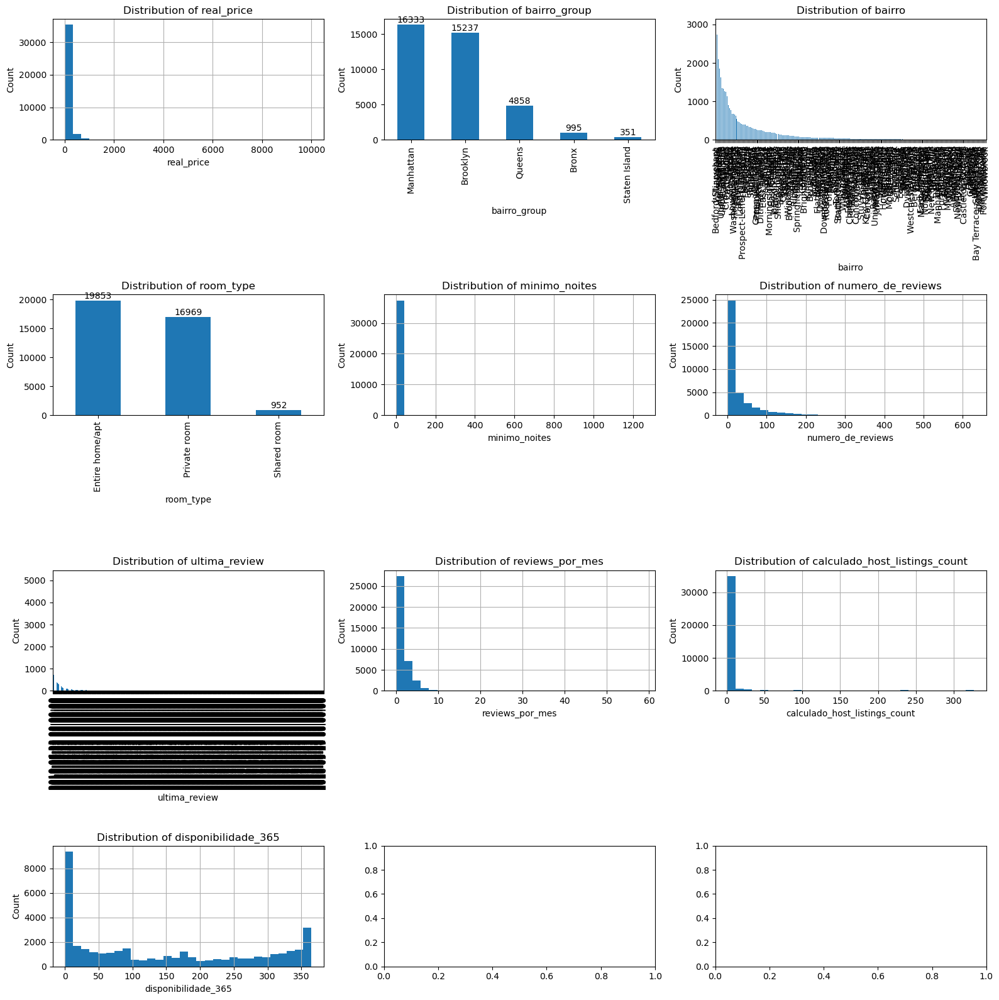

In [28]:
cols_to_plot = ['real_price', 'bairro_group', 'bairro', 'room_type', 'minimo_noites', 'numero_de_reviews', 
                'ultima_review', 'reviews_por_mes', 'calculado_host_listings_count', 'disponibilidade_365']
single_var(df_filtered, cols_to_plot)

#location will be addressed separatelly

##### Partial conclusions 

From the barplots and histograms of the entire dataset, we can see: 

- As noted before, some rentals are active but have very old last reviews.

- Most of the prices are ranged in less than 2000 dollars, with very few values higher than this. Those are probably outliers. We will have a closer look at this.

- Besides the variety of neighborhoods, the rentals can be distributed in 5 main neighborhood groups. Manhatan and Brooklyn have the higher number of rentals. Prices might range inside the groups depending on the specific neighborhood. We can check this possibility. Another possible analysis is to verify if we have different number of available dates for each neighborhood group.

- Only a few rentals are for shared rooms. They are probably cheaper. We will verify this by the correlation of both columns.

- There are a few listings with error on the minimun number of nights. We need to filter it. And also check its effect on the prices

- A few listings have a huge number of reviews. That could be an indicative that this listings are highly booked. We could look specifically for those listings to see why they are highly booked.

- A few listings have close to 60 reviews per month. That could be the case of shared rooms, so they have a lot of guests, or an error. We could check that.

- There are some hosts with a high number of rentals under their responsability. Probably are companies or realtors. An interesting analysis here is to check if companies/realtors prices are higher than regular rentals.

- The place's availability range. The data dictionary does not make clear if this info means "total yearly days that the listing is active', or 'remaining available days in the year'. If the case is the last scenario, we could see the "hotness" of the listing by looking for the remaning available days. We can also check if the availability affects the price.

In the next sections we will perform a deeper analysis on each of the mentioned topics

### 4.3.2 rentals with old reviews

In [29]:
#selecting only old reviews

df_old_reviews = df_filtered[(df_filtered['last_review_year'] <= 2017)]
df_old_reviews.shape

(6536, 17)

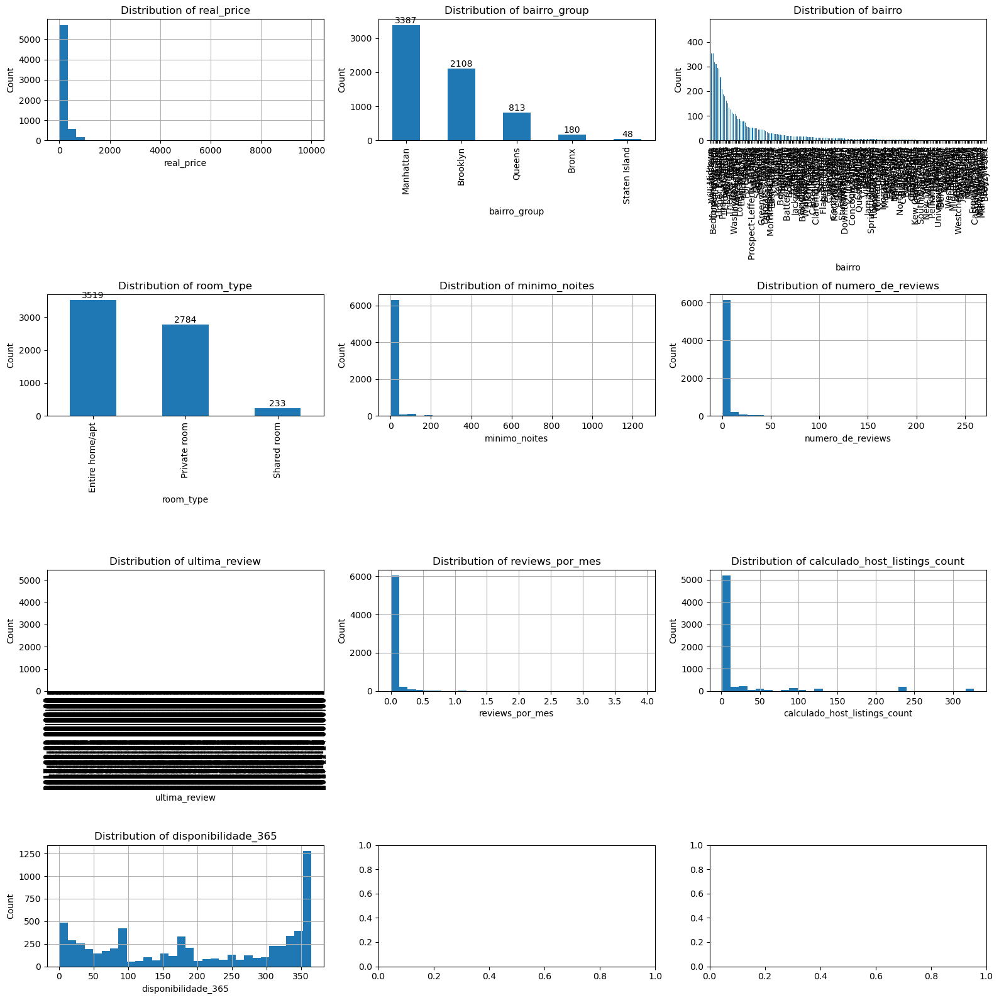

In [30]:
single_var(df_old_reviews, cols_to_plot)

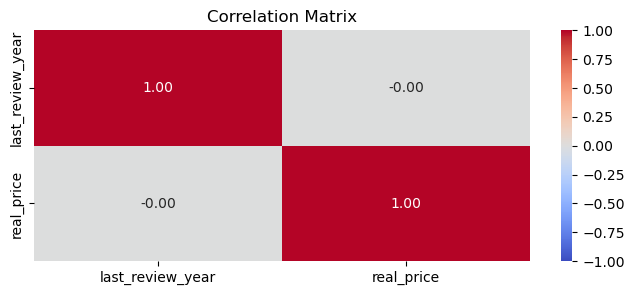

In [31]:
#checking the correlation between old reviews and price.
correlation_matrix = df_old_reviews[['last_review_year', 'real_price']].corr()

# heatmap
plt.figure(figsize=(8, 3))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()

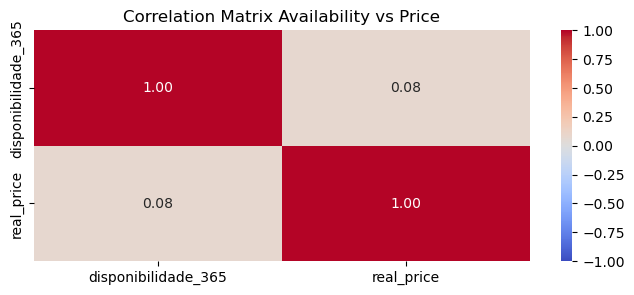

In [32]:
#checking the correlation between availability and price.
correlation_matrix2 = df_old_reviews[['disponibilidade_365', 'real_price']].corr()

# heatmap
plt.figure(figsize=(8, 3))
sns.heatmap(correlation_matrix2, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title('Correlation Matrix Availability vs Price')
plt.show()

- The rentals with very old last reviews seems to have similar behavior than the other rentals. Therefore, We can expeculate that those rentals were withdrawed for some time, and are currently available (our dataset cannot answer precisely this possibility). 

- We can also verify, by the correlation matrix, that price was not the main reason that those listings were not booked for a long time.

- The listings with old reviews, but that are active, will be kept in the df. 

- Additionally, availability is not closely related to price.

### 4.3.3 rentals with high prices

In [33]:
#checking the percentiles distribution of the prices
df_filtered['real_price'].describe(percentiles=[0.01, 0.05, 0.1, 0.25, 0.50, 0.75, 0.90, 0.95, 0.99])

count   37774.00
mean      155.37
std       237.16
min        10.00
1%         30.00
5%         40.00
10%        49.00
25%        70.00
50%       110.00
75%       180.00
90%       275.00
95%       375.00
99%       799.00
max     10000.00
Name: real_price, dtype: float64

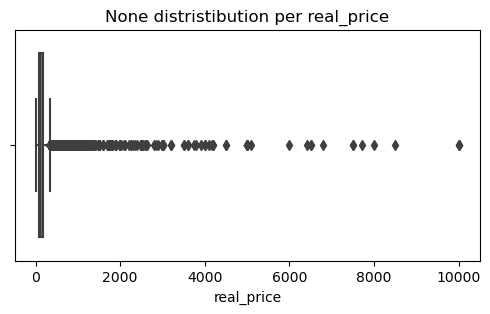

In [34]:
#running a boxplot to verify the possible outliers
singleboxplot(df_filtered, 'real_price', None, None)

We can see that in the dataset there are many rentals that could be considered outliers in our price range.
As price is our biggest goal in the predictive models, we should be careful with outliers, particularly in regression models.
We can calculate how many rentals could be considered outliers based on the boxplot whiskers (1.5 times the interquartile range od the data).

In [35]:
lower_percentile = np.percentile(df_filtered['real_price'], 25)
higher_percentile = np.percentile(df_filtered['real_price'], 75)

# Calculate the interquartile range (IQR)
iqr = higher_percentile - lower_percentile

# Define the lower and upper bounds for outliers
lower_threshold = lower_percentile - 1.5 * iqr
upper_threshold = higher_percentile + 1.5 * iqr

outliers_count_lower = (df_filtered['real_price'] < lower_threshold).sum()
outliers_count_upper = (df_filtered['real_price'] > upper_threshold).sum()
print(outliers_count_lower, outliers_count_upper)


0 2364


On this dataset case, We can expeculate that many variables can affect the price range of an rental. Maybe a number of rooms, localization, quality, amongst others. Therefore, excluding 2364 rentals from our list is not wise. We should be more careful with such a high amount of samples. 

We can have a better look at them before selecting an outlier threshold:

In [36]:
df_expensive = df_filtered[(df_filtered['real_price'] > upper_threshold)]
df_expensive.shape

(2364, 17)

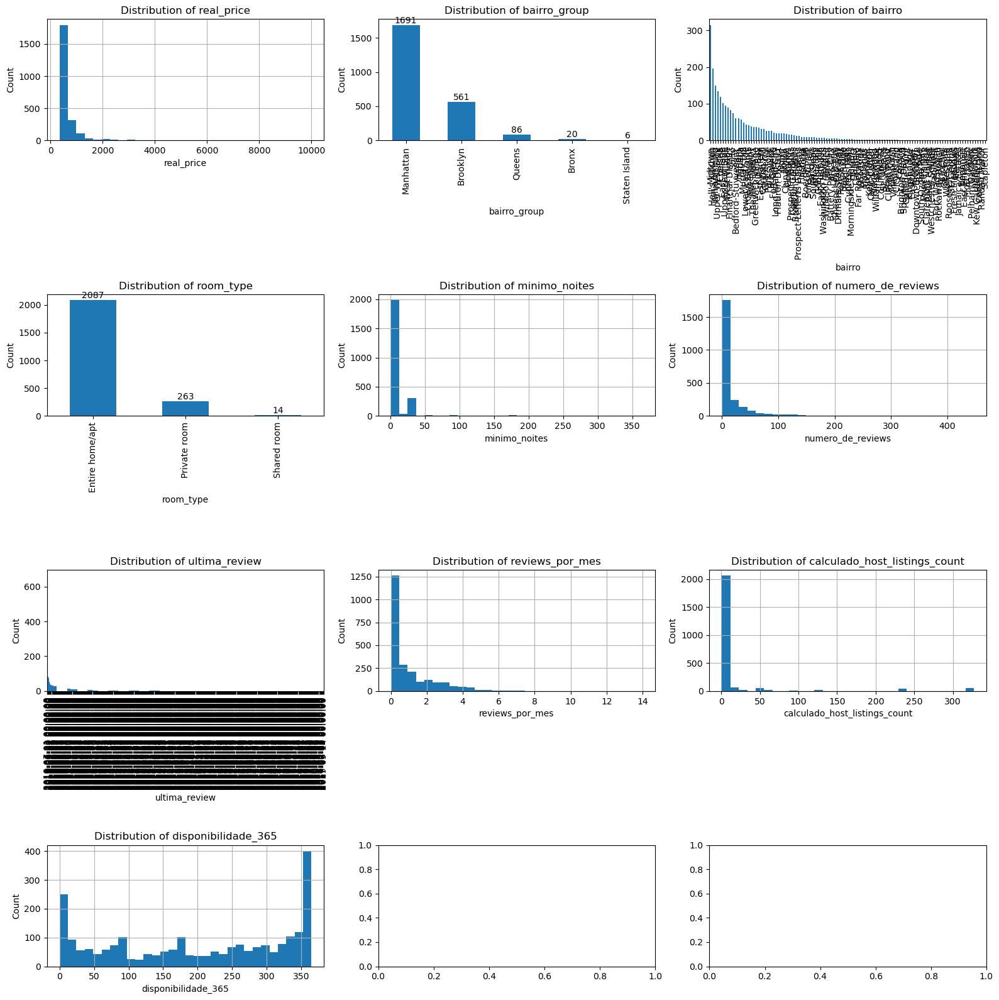

In [37]:
single_var(df_expensive, cols_to_plot)

We can see that most of the rentals are in Manhatan or Brooklyn, and most are the rental of the entire apt. However, the price range is still very high. We can look again for the distribution of the top 1% of the prices.

In [38]:
top_threshold = np.percentile(df_filtered['real_price'], 99)
df_expensive2 = df_filtered[(df_filtered['real_price'] > top_threshold)]
df_expensive2.shape

(369, 17)

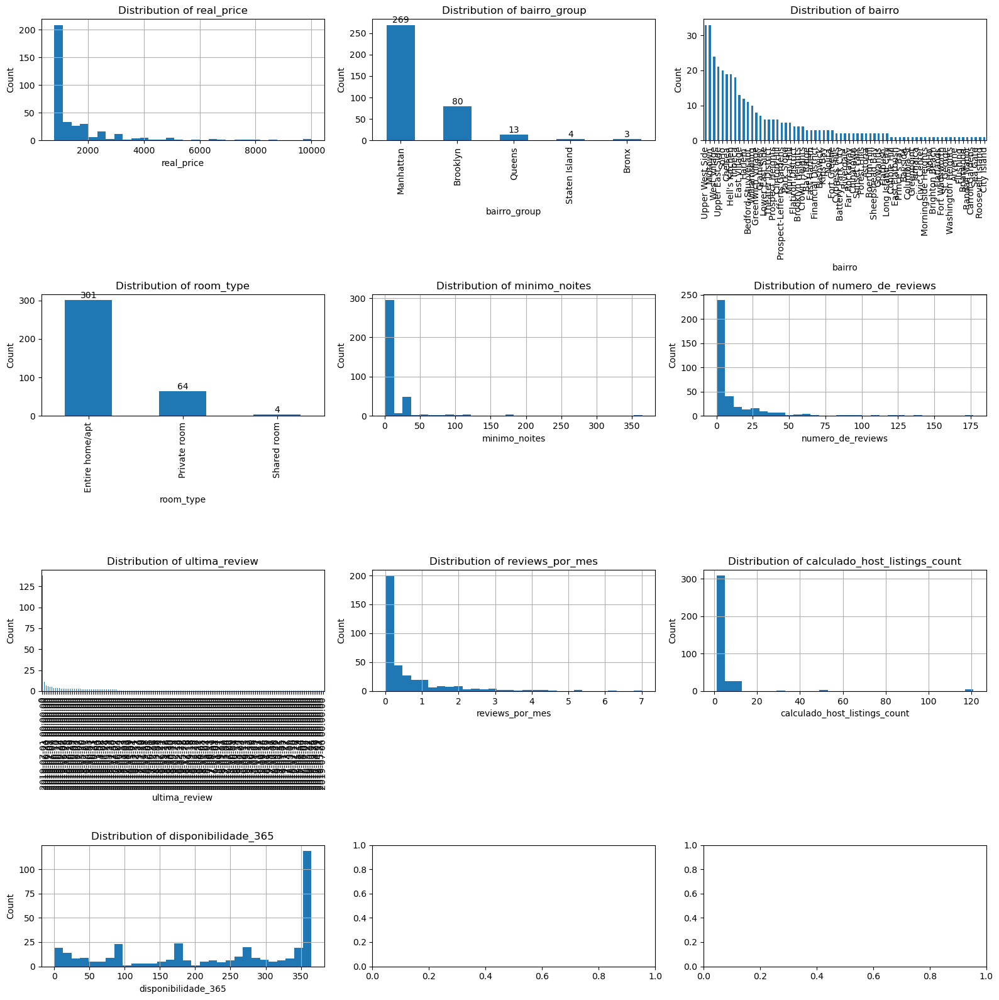

In [39]:
single_var(df_expensive2, cols_to_plot)

- Based on the data distribution, it is not clear why those rentals are much more expensive than the others. Maybe a better localization compared to others, but we can see that we still have rentals in different neighborhoods.

- However, the price distribution is far from normal distribution, so lets first be conservative and exclude the outliers.

- Another option here would be Winsoring the data, that means, take all the outliers and replace the values for the upper threshold. This way we could keep the samples, but reducing the effect of possible outliers. We would still keep those apartments as expensive, but with mild values than currently.

In [40]:
df_filtered = df_filtered[(df_filtered['real_price'] <= upper_threshold)]
df_filtered.shape

(35410, 17)

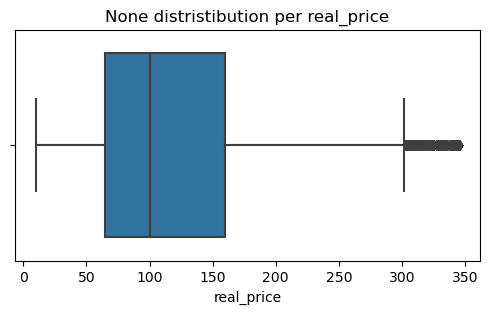

In [41]:
singleboxplot(df_filtered, 'real_price', None, None)



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.



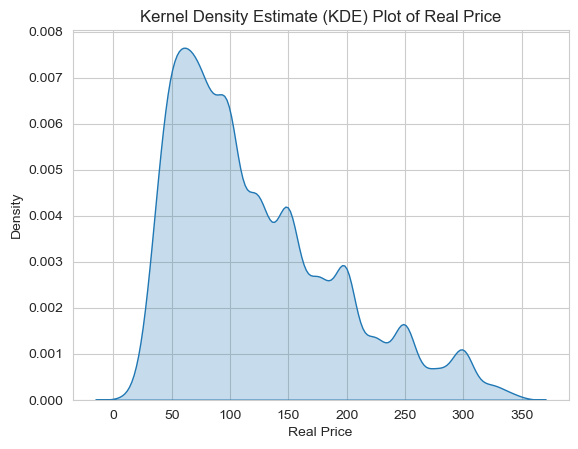

In [42]:
sns.set_style("whitegrid")
sns.kdeplot(data=df_filtered['real_price'], shade=True)
plt.title('Kernel Density Estimate (KDE) Plot of Real Price')
plt.xlabel('Real Price')
plt.ylabel('Density')
plt.show()

As we can see on the boxplot, the price range is much lower now.

### 4.3.4 Minimum nights

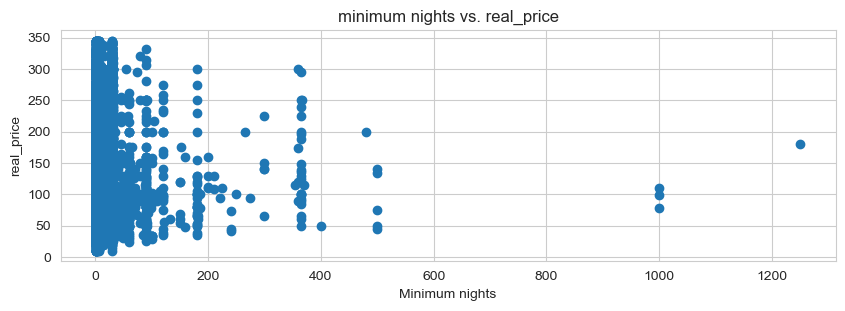

In [43]:
plt.figure(figsize=(10, 3))
plt.scatter(df_filtered['minimo_noites'], df_filtered['real_price'])
plt.title('minimum nights vs. real_price')
plt.xlabel('Minimum nights')
plt.ylabel('real_price')

plt.show()

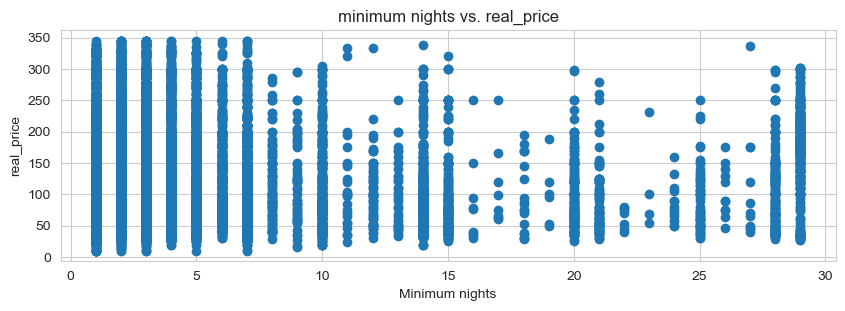

In [44]:
#A few rentals are shows long term minimum nights. In NY, short-term rentals may go up to 30 days, anything more than this is 
#considered long term rental. As the platform focus is short-term rentals, we can exclude the ones with more than 30 days.

df_filtered = df_filtered[df_filtered['minimo_noites'] < 30]

plt.figure(figsize=(10, 3))
plt.scatter(df_filtered['minimo_noites'], df_filtered['real_price'])
plt.title('minimum nights vs. real_price')
plt.xlabel('Minimum nights')
plt.ylabel('real_price')

plt.show()

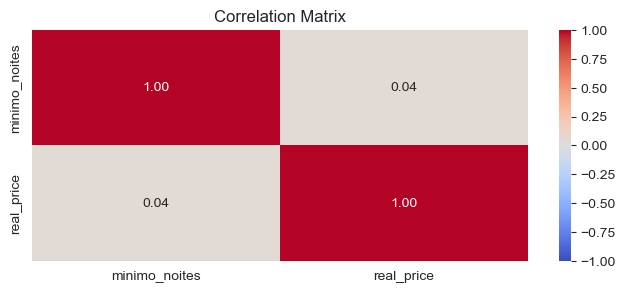

In [45]:
#to verify matematically the correlation between minimum nights and price:

#checking the correlation between minimum nights and price
correlation_matrix4 = df_filtered[['minimo_noites', 'real_price']].corr()

# heatmap

plt.figure(figsize=(8, 3))
sns.heatmap(correlation_matrix4, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()


#### Partial conclusion

- There is no direct correlation between price and minimum nights. (Question 2b)
- we excluded the long term rentals based in NY state law.

### 4.3.5 rental's neigborhoods

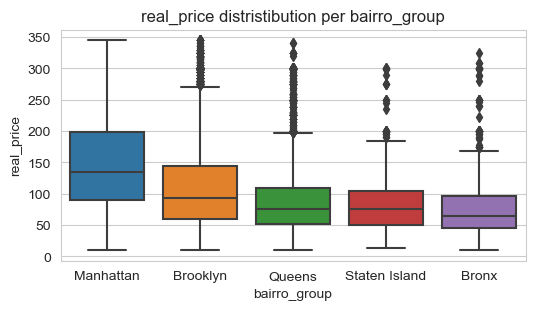

In [46]:
singleboxplot(df_filtered, 'bairro_group', 'real_price', None)

In [47]:
# As neighborhood_group is a categorical variable, we can perform an Anova test to verify the correlation with price

neighborhood_group = df_filtered['bairro_group'].unique()
neighborhood_group_data = [df_filtered[df_filtered['bairro_group'] == neighborhood_group]['real_price'] for neighborhood_group in neighborhood_group]

# ANOVA test
anova_result = f_oneway(*neighborhood_group_data)

# ANOVA results
print('ANOVA Results:')
print('F-statistic:', anova_result.statistic)
print(f'P-value: {anova_result.pvalue:e}')

ANOVA Results:
F-statistic: 957.2112837141873
P-value: 0.000000e+00


In [48]:
#Anova showed that whithin the neighborhood_group we have significantly different prices, let's see pairwise now
tukey_results = pairwise_tukeyhsd(df_filtered['real_price'], df_filtered['bairro_group'])
print(tukey_results)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05       
  group1      group2    meandiff p-adj   lower    upper   reject
----------------------------------------------------------------
    Bronx      Brooklyn   31.402    0.0  25.4631   37.341   True
    Bronx     Manhattan  68.8753    0.0  62.9151  74.8355   True
    Bronx        Queens  13.3981    0.0    7.077  19.7193   True
    Bronx Staten Island  10.9638 0.0614  -0.3156  22.2433  False
 Brooklyn     Manhattan  37.4732    0.0  35.2763  39.6702   True
 Brooklyn        Queens -18.0039    0.0 -21.0468  -14.961   True
 Brooklyn Staten Island -20.4382    0.0 -30.2631 -10.6133   True
Manhattan        Queens -55.4771    0.0 -58.5612 -52.3931   True
Manhattan Staten Island -57.9114    0.0 -67.7491 -48.0737   True
   Queens Staten Island  -2.4343 0.9648 -12.4948   7.6262  False
----------------------------------------------------------------


- The boxplot and the anova test shows that price ranges significantly based on neighborhood group.
- The tukey test showed that only Bronx/Staten Island, and Queens/Staten Island does not have a significantly different prices.

Now we can see the price distribution for each neighborhood

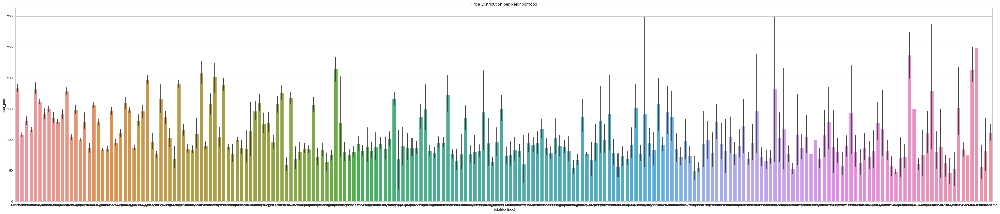

In [49]:
plt.figure(figsize=(50, 10)) #didnt use the function single boxplot because i wanted to adjust the size
sns.barplot(x='bairro', y='real_price', data=df_filtered)
plt.title('Price Distribution per Neighborhood')
plt.xlabel('Neighborhood')
plt.ylabel('real_price')
plt.show()

In [50]:
#to clearly check the most expensive neighborhood in a way that we can actually read their names, we can plot a treemap
#additionally, we can use the bairro_groups, and see the distribution of the average prices per neighborhood and groups

df_bairro = df_filtered.groupby('bairro')['real_price'].agg(['sum', 'count']).reset_index() #create a df to calculate the average price per neighborhood
df_bairro['average_price_neighborhood'] = df_bairro['sum']/df_bairro['count']
df_bairro = pd.merge(df_filtered, df_bairro[['bairro', 'average_price_neighborhood']], on='bairro', how='left')
mean_prices = df_bairro.groupby(['bairro_group', 'bairro'])['average_price_neighborhood'].mean().reset_index() #grouping by the neighborhood and geting the mean values (otherwise the treemap will plot the sum of the average_price_neighborhood)

fig = px.treemap(mean_prices, path=['bairro_group','bairro'], values='average_price_neighborhood', color='bairro_group',
                 title='Treemap: Mean price Distribution per Neighborhood Group')
fig.update_traces(root_color="lightgray")  # Set color for root nodes
fig.update_layout(margin=dict(l=25, r=25, b=25, t=25), height=800)
fig.show()

In [51]:
#we can now have a better look ploting a treemap for the rentals count for all the neighborhoods
neighborhood_count = df_bairro.groupby(['bairro_group', 'bairro']).size().reset_index(name='rental_count')
fig = px.treemap(neighborhood_count, path=['bairro_group','bairro'], values='rental_count', color='bairro_group',
                 title='Treemap: Mean price Distribution per Neighborhood Group')
fig.update_traces(root_color="lightgray")  # Set color for root nodes
fig.update_layout(margin=dict(l=25, r=25, b=25, t=25), height=800)
fig.show()

In [52]:
# As neighborhood is a categorical variable, we can perform an Anova test to verify the correlation with price

neighborhood = df_filtered['bairro'].unique()
neighborhood_data = [df_filtered[df_filtered['bairro'] == neighborhood]['real_price'] for neighborhood in neighborhood]

# ANOVA test
anova_result = f_oneway(*neighborhood_data)

# ANOVA results
print('ANOVA Results:')
print('F-statistic:', anova_result.statistic)
print(f'P-value: {anova_result.pvalue:e}')

ANOVA Results:
F-statistic: 45.78334873037208
P-value: 0.000000e+00


In [53]:
#Tukey test could not be performed here in the data as it is, due to the high number of pairwise comparisons. 
#If needed, we could select the neighborhoods based on average price ranges, and perform separatelly. But graphycally we already saw the differences.

#tukey_results = pairwise_tukeyhsd(df_filtered['price'], df_filtered['bairro'])
#print(tukey_results)

#### Partial conclusions

- As expected, Manhattan is the most expensive neighborhood_group (bairro_group), as we can see by the average on the boxplot. As the treemap is ploting the mean prices per neighborhood, so it is clear that from all the neighborhoods, the most expensive of them are all from Manhattan and Brooklyn, followed by Queens.

- if we consider the sum of the rental prices, the default for the treemap, it would be an error, because it would bias to the neighborhoods with most apartments. On the second treemap we can see that the neighborhoods with the highest amount of rentals are Bedford and Williamsburg, from Brooklyn.

- Anova test prooved that there is a significant variation in price based on neighborhood. This could be seen graphycally, as mentioned above.

- As the average price for each neighboorhood is different, we could consider it as a feature. However, we must be very carefull with data leakage, so it can be computed after the data split.

#### - This analysis answer the question 2a, that asks where would be the best location to invest in an apartment to rent. That place would be Tribeca, in Manhattan. However, it would be necessary to evaluate the apartment prices in this location before conclude that would be a great deal to invest in rental apartment there. NoHo would also be great to invest, since most of the places there are luxurious lofts. 

Now, another interesting plot is the map from NY, to verify the proximity to famous and tourist places on the city. If we see that places nearby tourist and iconic places are more expensive, a good new feature would be to calculate the distance of the apartment to the closest touristic place... or maybe to subway stations.

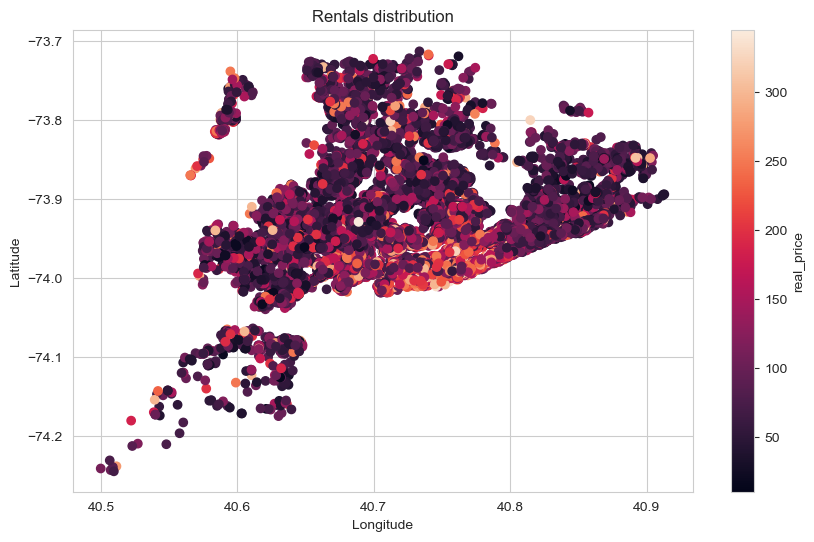

In [54]:
#we can plot a scatterplot to verify the location distribution
plt.figure(figsize=(10, 6))
ax1 = plt.scatter(df_filtered['latitude'], df_filtered['longitude'], c=df_filtered['real_price'])

plt.title('Rentals distribution')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar(ax1, label='real_price')

plt.show()

In [55]:
fig = px.scatter_mapbox(df_filtered, lat='latitude', lon='longitude', color='bairro_group', hover_name='bairro_group',
                        zoom=9, mapbox_style='open-street-map')

fig.update_layout(title='Bairro Group Distribution on Map')

fig.show()

In [56]:
# we can check the touristic places in NY, to see if the prices corroborate with close locations to touristic places.
#For that, we can use the OSMnx library to retrieve info from Open Street Map

place = 'New York City, New York, USA'
tags = {'tourism': True, 'amenity': ['museum', 'art_gallery', 'historic', 'attraction']}

gdf = ox.features_from_place(place, tags)
projected_crs = 'EPSG:32618'
gdf_projected = gdf.to_crs(projected_crs)
gdf_projected['centroid'] = gdf_projected.geometry.centroid

#back to geographic CRS for latitude and longitude
gdf['centroid'] = gdf_projected['centroid'].to_crs('EPSG:4326')

# Extracting name and coordinates into a DataFrame
tourist_spots_df = pd.DataFrame({
    'Name': gdf['name'],
    'Longitude': gdf['centroid'].x,
    'Latitude': gdf['centroid'].y
}).reset_index(drop=True)

# Correcting missing names or geometries
tourist_spots_df.dropna(subset=['Name', 'Longitude', 'Latitude'], inplace=True)

fig = px.scatter_mapbox(tourist_spots_df, lat='Latitude', lon='Longitude', color_discrete_sequence=['purple'], hover_name='Name',
                        zoom=9, mapbox_style='open-street-map')

fig.update_layout(title='Bairro Group Distribution on Map')

fig.show()

#NOTE: this version is getting information about some hotels and restaurants as well. With more time we can get rid of them.

C:\Users\vinic\anaconda3\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [57]:
#Plotting both maps together (and using price as color)
fig_rentals = px.scatter_mapbox(df_filtered, lat='latitude', lon='longitude', color='real_price', hover_name='bairro_group',
                                zoom=9, opacity=0.5, mapbox_style='open-street-map',color_continuous_scale=['darkblue', 'yellow', 'red'],
                                title='Bairro Group Distribution on Map')

fig_rentals.update_traces(marker=dict(size=4))

fig_tourist_spots = px.scatter_mapbox(tourist_spots_df, lat='Latitude', lon='Longitude', color_discrete_sequence=['green'], 
                                       hover_name='Name', zoom=9, mapbox_style='open-street-map', title='Tourist Places on Map')

fig_tourist_spots.update_traces(marker=dict(size=3))


for trace in fig_tourist_spots.data:
    fig_rentals.add_trace(trace)

fig_rentals.update_layout(title='Combined Map: Bairro Group Distribution and Tourist Places')
fig_rentals.show()


C:\Users\vinic\anaconda3\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



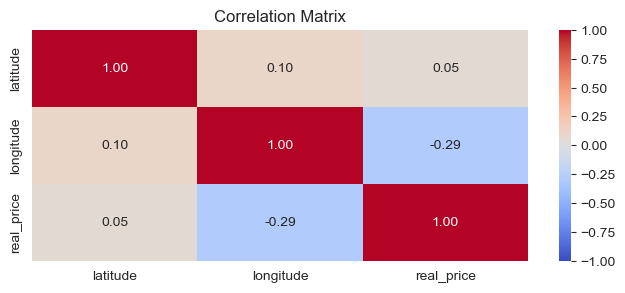

In [58]:
#to verify matematically the correlation between location and price:

#checking the correlation between location and price
correlation_matrix3 = df_filtered[['latitude', 'longitude', 'real_price']].corr()

# heatmap
plt.figure(figsize=(8, 3))
sns.heatmap(correlation_matrix3, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()

plt.show()

- From the maps we can see that price and proximity to touristic places are not closely correlated. On the places we have more expensive rentals, we also have less expensive ones nearby. Maybe the correlation would be seen if we had information about the rental's size, so we could compare similar sizes rentals and check the proximity effect. However, as we do not have this information, I will not consider use the distance to touristic places as a feature.

-

- Visually, the prices seems to increase as the places are closer to the statue of liberty. although all the touristic places are not of great advantage, maybe the distance to statue of liberty can be a good feature.

In [59]:
#Statue of liberty distance :
target_latitude, target_longitude = 40.68924, -74.04454

# Calculate Euclidean distance for each rental
df_filtered['distance_to_liberty'] = df_filtered.apply(lambda row: simple_distance(row['latitude'], row['longitude'], target_latitude, target_longitude), axis=1)

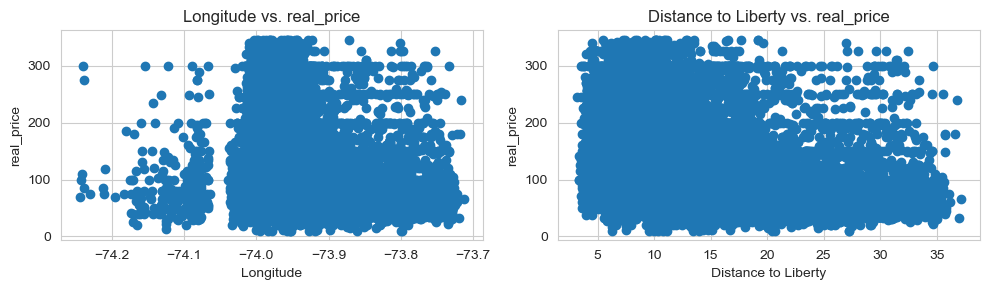

In [60]:
plt.figure(figsize=(10, 3))

# scatter plot of longitude vs price
plt.subplot(1, 2, 1)
plt.scatter(df_filtered['longitude'], df_filtered['real_price'])
plt.title('Longitude vs. real_price')
plt.xlabel('Longitude')
plt.ylabel('real_price')

# Scatter plot of distance to liberty vs price
plt.subplot(1, 2, 2)
plt.scatter(df_filtered['distance_to_liberty'], df_filtered['real_price'])
plt.title('Distance to Liberty vs. real_price')
plt.xlabel('Distance to Liberty')
plt.ylabel('real_price')

plt.tight_layout()
plt.show()

#### Partial conclusions

- As expected, neighborhood presents an effect on price, as some neighborhoods have higher average prices. 

- The new feature, distance to the statue of liberty, has a slightly better correlation with price compared to lat and lon data. I will keep it for now. Probably the difference on prices with similar distances are related to rental space, number of rooms, Quality, etc.

### 4.3.6 Room_type

We will now have a better look to room types and price distribution

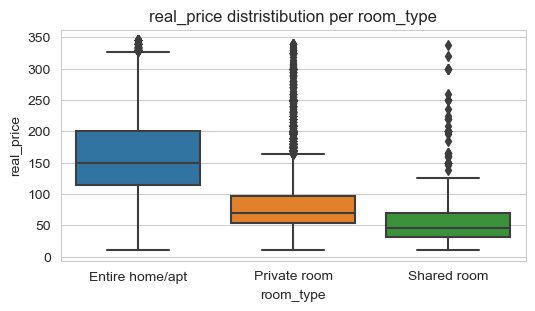

In [61]:
singleboxplot(df_filtered, 'room_type', 'real_price', None)

In [62]:
room_types = df_filtered['room_type'].unique()

# Create separate data arrays for each room type
room_type_data = [df_filtered[df_filtered['room_type'] == room_type]['real_price'] for room_type in room_types]

# Perform ANOVA test
anova_result = f_oneway(*room_type_data)

# Print the ANOVA results
print('ANOVA Results:')
print('F-statistic:', anova_result.statistic)
print(f'P-value: {anova_result.pvalue:e}')

ANOVA Results:
F-statistic: 9512.988270155844
P-value: 0.000000e+00


In [63]:
# Tukey's HSD post-hoc test
tukey_results = pairwise_tukeyhsd(df_filtered['real_price'], df_filtered['room_type'])

# results
print(tukey_results)

          Multiple Comparison of Means - Tukey HSD, FWER=0.05          
     group1        group2     meandiff p-adj   lower     upper   reject
-----------------------------------------------------------------------
Entire home/apt Private room  -82.5266   0.0  -83.9722  -81.0811   True
Entire home/apt  Shared room -105.0478   0.0 -109.5223 -100.5733   True
   Private room  Shared room  -22.5212   0.0  -26.9915  -18.0508   True
-----------------------------------------------------------------------


#### Partial conclusions

- As expected, entire home/apt has a higher average price than a private or shared room. 
- In order to get this information to a regression model, we will need to encode this categorical variable.

### 4.3.7 Reviews data

We already handled old last reviews in bellow. Now we can focus on number of reviews and montly reviews.

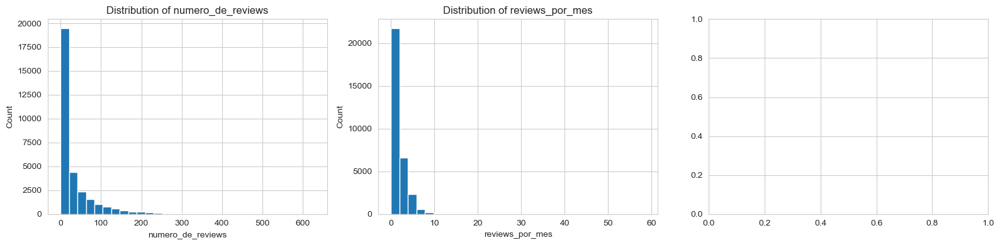

In [64]:
cols = ['numero_de_reviews', 'reviews_por_mes']

single_var(df_filtered, cols)

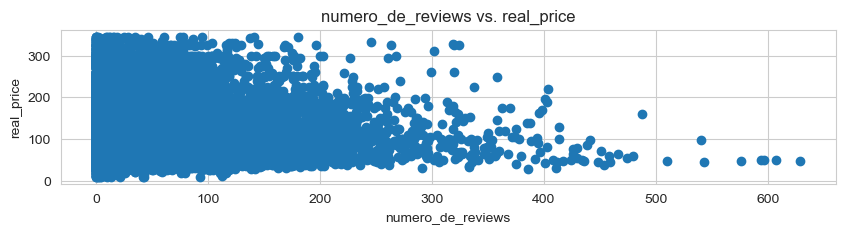

In [65]:
#Let's verify the correlations with price

plt.figure(figsize=(10, 2))
plt.scatter(df_filtered['numero_de_reviews'], df_filtered['real_price'])
plt.title('numero_de_reviews vs. real_price')
plt.xlabel('numero_de_reviews')
plt.ylabel('real_price')

plt.show()

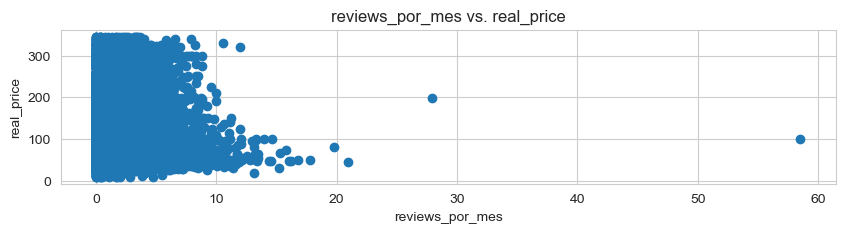

In [66]:
plt.figure(figsize=(10, 2))
plt.scatter(df_filtered['reviews_por_mes'], df_filtered['real_price'])
plt.title('reviews_por_mes vs. real_price')
plt.xlabel('reviews_por_mes')
plt.ylabel('real_price')

plt.show()

In [67]:
#Excluding listing with more than 20 monthly reviews

df_filtered = df_filtered[df_filtered['reviews_por_mes'] < 20]
df_filtered.shape

(31479, 18)

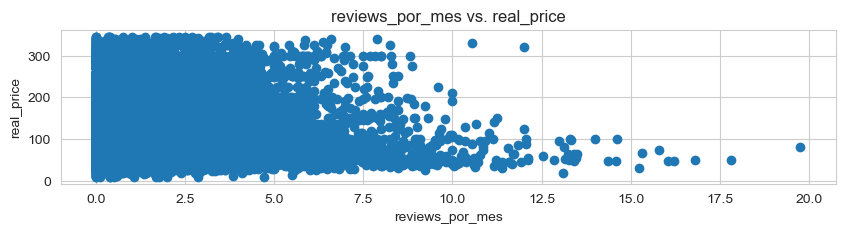

In [68]:
#plot again
plt.figure(figsize=(10, 2))
plt.scatter(df_filtered['reviews_por_mes'], df_filtered['real_price'])
plt.title('reviews_por_mes vs. real_price')
plt.xlabel('reviews_por_mes')
plt.ylabel('real_price')

plt.show()

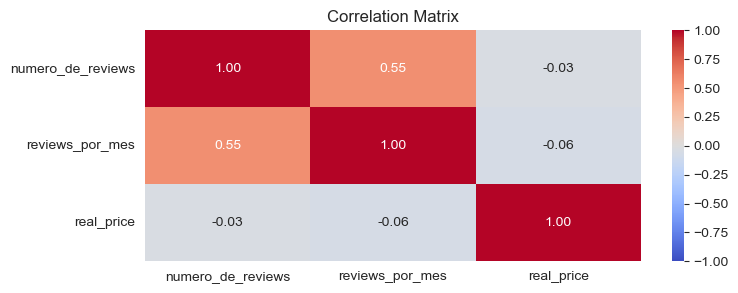

In [69]:
#Checking correlation:

#checking the correlation between number of reviews and monthly reviews and price
correlation_matrix5 = df_filtered[['numero_de_reviews', 'reviews_por_mes', 'real_price']].corr()

# heatmap

plt.figure(figsize=(8, 3))
sns.heatmap(correlation_matrix5, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()

The matematical correlation is not very high between reviews and price. However, we can consider a new feature based on those features. For example, we can see a good linearity for price and number of reviews from 300 - 600, and for price vs montly reviews in the range 7.5-20. We can check if we truly have a correlation in this range.

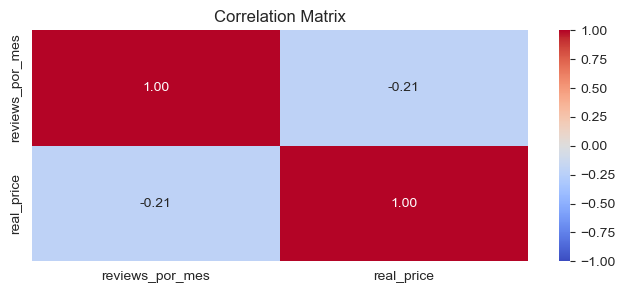

In [70]:
df_filtered_montly_test = df_filtered[(df_filtered['reviews_por_mes'] > 7.5)] 

correlation_matrix6 = df_filtered_montly_test[['reviews_por_mes', 'real_price']].corr()

# heatmap

plt.figure(figsize=(8, 3))
sns.heatmap(correlation_matrix6, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()

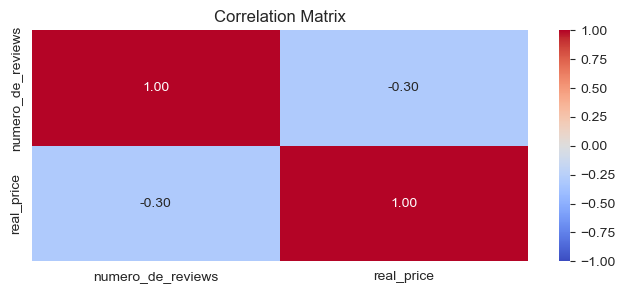

In [71]:
df_filtered_numberrev_test = df_filtered[(df_filtered['numero_de_reviews'] > 300)] 

correlation_matrix7 = df_filtered_numberrev_test[['numero_de_reviews', 'real_price']].corr()

# heatmap

plt.figure(figsize=(8, 3))
sns.heatmap(correlation_matrix7, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()

As we can see, in the mentioned ranges we have a good correlation. Lets create 2 features based on that information.

In [72]:
df_filtered['number_reviews_more_than_300'] = (df_filtered['numero_de_reviews'] >= 300).astype(int)

In [73]:
df_filtered['number_monthly_reviews_more_than_7point5'] = (df_filtered['reviews_por_mes'] >= 7.5).astype(int)

In [74]:
df_filtered.shape

(31479, 20)

#### Partial conclusions

- There is a good correlation between price and number of reviews and monthlyreviews, but in a specific range.

- the correlation is negative, so it indicates that the listings that are more rented, are probably the cheaper ones. So price is prooved as of a great importance in rental interest

### 4.3.8 Host listings count

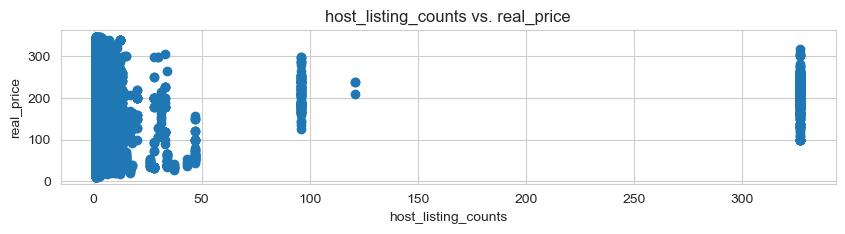

In [75]:
plt.figure(figsize=(10, 2))
plt.scatter(df_filtered['calculado_host_listings_count'], df_filtered['real_price'])
plt.title('host_listing_counts vs. real_price')
plt.xlabel('host_listing_counts')
plt.ylabel('real_price')

plt.show()

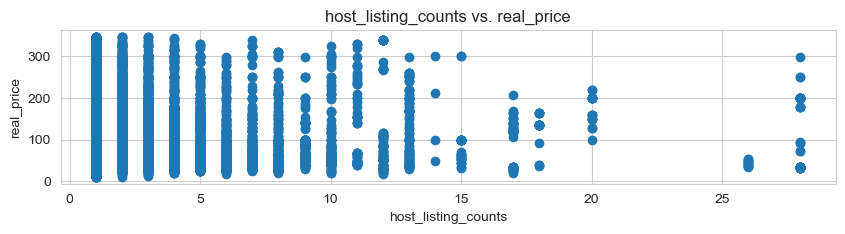

In [76]:
#we can check if there is a better correlation in a different range
df_filtered_host = df_filtered[(df_filtered['calculado_host_listings_count'] < 30)]

plt.figure(figsize=(10, 2))
plt.scatter(df_filtered_host['calculado_host_listings_count'], df_filtered_host['real_price'])
plt.title('host_listing_counts vs. real_price')
plt.xlabel('host_listing_counts')
plt.ylabel('real_price')

plt.show()

#### Partial conclusions:

- There is no clear direct correlation between host listings counts and price.
- There are a few hosts with several listings, that indicates that realtors and companies are using the website to rent their apartments. Those are clients with a higher potential interest, since they alone have so many listings.

### 4.3.9 Availability along the year (Disponibilidade_365)

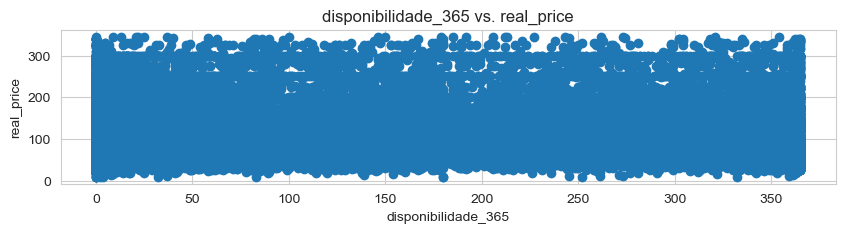

In [77]:
plt.figure(figsize=(10, 2))
plt.scatter(df_filtered_host['disponibilidade_365'], df_filtered_host['real_price'])
plt.title('disponibilidade_365 vs. real_price')
plt.xlabel('disponibilidade_365')
plt.ylabel('real_price')

plt.show()

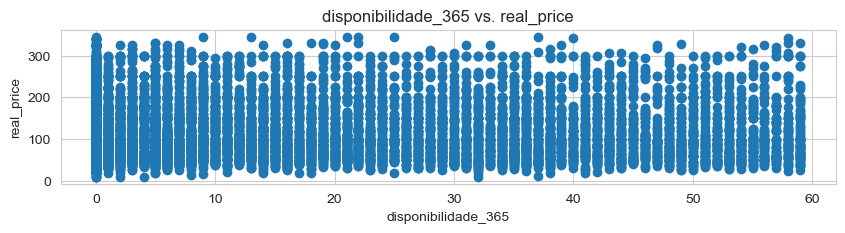

In [78]:
df_filtered_available = df_filtered[(df_filtered['disponibilidade_365'] < 60)]

plt.figure(figsize=(10, 2))
plt.scatter(df_filtered_available['disponibilidade_365'], df_filtered_available['real_price'])
plt.title('disponibilidade_365 vs. real_price')
plt.xlabel('disponibilidade_365')
plt.ylabel('real_price')

plt.show()

- There is no clear direct correlation between price and availability. However, along with other variables it have a difference.

- we can try a few new features from here, such as 'almost not available' for listings with availability < 15 days a year, 'hollidays_available' for listings between 15-90 availability, and 'highly available' for listings with more than 90 days/year, but less than 350. Additionally, we can set all that have >350 days availability as 'comercial', since it is likely to be comercial, and not personally listed. This comercial feature goes along the host_listings_number, as many of the comercial places will have high availability.

In [79]:
df_filtered['low_availability'] = (df_filtered['disponibilidade_365'] <= 15).astype(int)
df_filtered['medium_availability'] = ((df_filtered['disponibilidade_365'] > 15)& (df_filtered['disponibilidade_365'] <= 90)).astype(int)
df_filtered['high_availability'] = ((df_filtered['disponibilidade_365'] > 90) & (df_filtered['disponibilidade_365'] <= 350)).astype(int)
df_filtered['comercial_availability'] = (df_filtered['disponibilidade_365'] > 350).astype(int)
df_filtered.shape

(31479, 24)

In [80]:
availability_columns = ['low_availability', 'medium_availability', 'high_availability', 'comercial_availability']

# Perform ANOVA for each availability column
for column in availability_columns:
    group_low = df_filtered[df_filtered[column] == True]['real_price']
    group_high = df_filtered[df_filtered[column] == False]['real_price']
    
    f_statistic, p_value = f_oneway(group_low, group_high)
    print(f"ANOVA for {column}: F-statistic = {f_statistic}, p-value = {p_value}")

ANOVA for low_availability: F-statistic = 33.8084111782864, p-value = 6.140211623316005e-09
ANOVA for medium_availability: F-statistic = 18.402949050304926, p-value = 1.7931383026701497e-05
ANOVA for high_availability: F-statistic = 105.02088317719905, p-value = 1.3211293305308767e-24
ANOVA for comercial_availability: F-statistic = 4.2453521266053995, p-value = 0.03936610602666334


#### Partial conclusions

- Besides a not direct correlation between price and availability, we can create new features based on this feature. We created availability levels features. Anova test showed that whithin each new feature, we do have a significative difference in price. Therefore, we can keep this new features.

### 4.3.10 Listing Name


In [81]:
# Download necessary resources
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\vinic\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\vinic\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [82]:
#apply a function to detect and exclude the special characteres and non_english words
mask = df_filtered['nome'].apply(detect_english_and_special)

# Filter the DataFrame to keep only rows where the condition is True
df_filtered = df_filtered[mask]

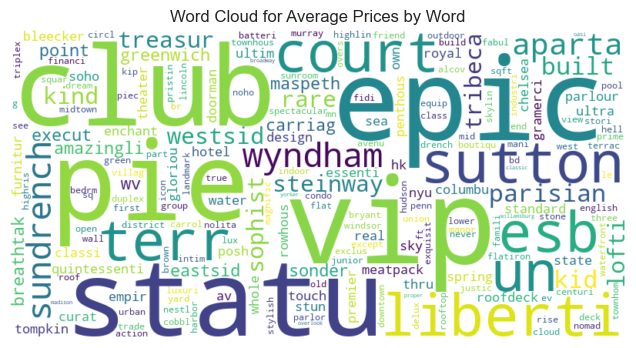

In [83]:
# Apply preprocessing to 'name' column
df_filtered['name_tokens'] = df_filtered['nome'].apply(preprocess_text)

# Create a set of unique words from all listings
all_words = set()
for tokens in df_filtered['name_tokens']:
    all_words.update(tokens)

# Create a dictionary to store the sum of prices and count for each word
word_sum_prices = {word: {'sum': 0, 'count': 0} for word in all_words}

# Calculate the sum of prices and count for each word
for index, row in df_filtered.iterrows():
    for word in row['name_tokens']:
        word_sum_prices[word]['sum'] += row['real_price']
        word_sum_prices[word]['count'] += 1

# Filter out words with count less than 3
word_sum_prices = {word: value for word, value in word_sum_prices.items() if value['count'] >= 3}

# Calculate the average price for each word
word_avg_prices = {word: word_sum_prices[word]['sum'] / word_sum_prices[word]['count'] if word_sum_prices[word]['count'] > 2 else 0 for word in word_sum_prices}

# Generate a word cloud based on the averages of prices
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_avg_prices)

# Plot the word cloud
plt.figure(figsize=(10, 4))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Average Prices by Word')
plt.show()

- If we consider only words that apears at least 3 times, we have the above word map. However, we can clearly see that some words are correlated to expensive hotels, such as Beekman and Continental. To avoid this behaviour, we can increse the minimum times that a word must appear to be shown here.

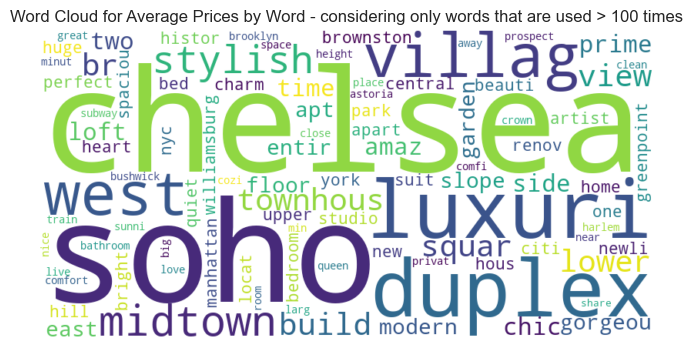

In [84]:
# Calculate the average price for each word
word_avg_prices2 = {word: word_sum_prices[word]['sum'] / word_sum_prices[word]['count'] if word_sum_prices[word]['count'] > 100 else 0 for word in word_sum_prices}

# Generate a word cloud based on the averages of prices
wordcloud2 = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_avg_prices2)

# Plot the word cloud
plt.figure(figsize=(10, 4))
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Average Prices by Word - considering only words that are used > 100 times')
plt.show()

In [85]:
def calculate_token_sum(tokens):
    return sum(word_avg_prices[token] for token in tokens if token in word_avg_prices)

df_filtered['name_tokens_sum'] = df_filtered['name_tokens'].apply(calculate_token_sum)
df_filtered = df_filtered[(df_filtered['name_tokens_sum'] > 1)]

#### Partial conclusions

- Considering words used more than 100 times, Stock and Exchange are the most valuable words. Both also indicates the localization of the rental, that is a great location, near NASDAQ. Duplex, luxurious, rooftop and patio are amongst the most price-related words. In this case, the words indicate the size or quality of the listing. Sonder is also in highlight, and it indicates a website for short-rentals.

##### Therefore, amongst the words used, we can clearly see a high value amongst words that indicates luxurious hotels, great locations, or highlights the high quality of the rental.

## 5. Data overview after additional filterings



In [86]:
cols_to_plot2 = ['bairro_group', 'bairro', 'room_type', 
                'real_price', 'minimo_noites', 'numero_de_reviews', 'ultima_review', 'reviews_por_mes', 
                'calculado_host_listings_count', 'disponibilidade_365', 'last_review_year', 
                'last_review_month', 'distance_to_liberty', 'number_reviews_more_than_300', 
                'number_monthly_reviews_more_than_7point5', 'low_availability', 'medium_availability', 
                'high_availability', 'comercial_availability', 'name_tokens_sum']

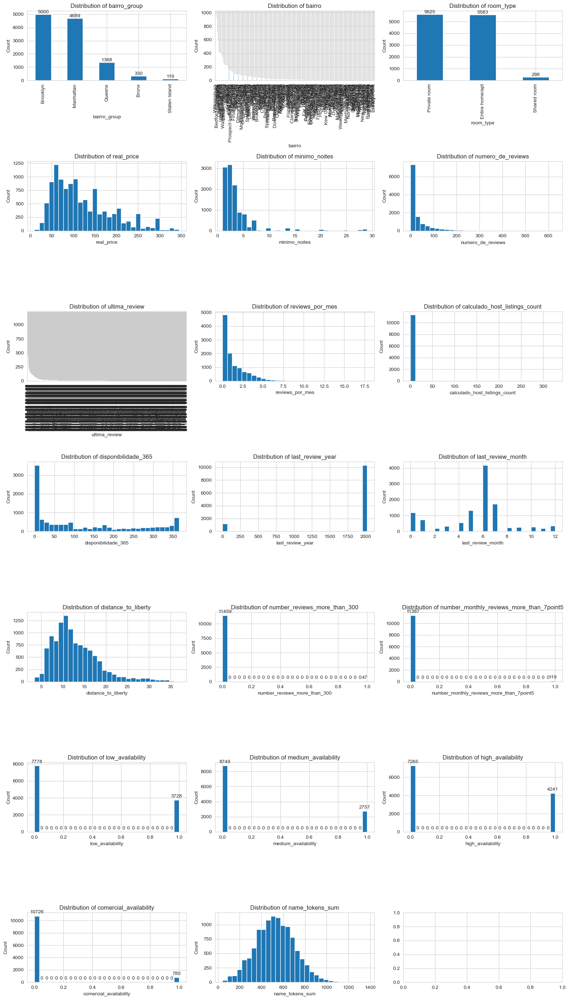

In [87]:
single_var(df_filtered, cols_to_plot2)

#### Data transformation

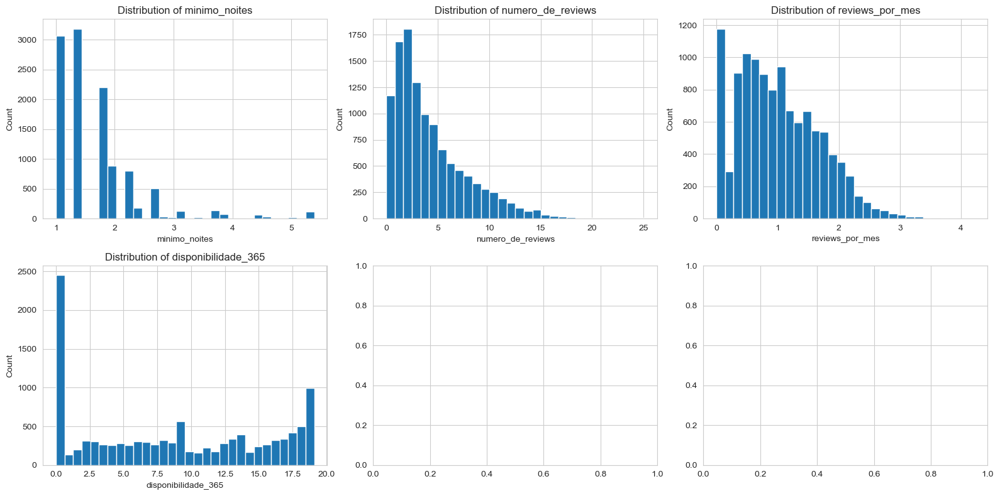

In [88]:
#log transformation for data
features = ['minimo_noites', 'numero_de_reviews', 'reviews_por_mes', 'disponibilidade_365']
for feature in features:
    df_filtered[feature] = df_filtered[feature].apply(np.sqrt)
    
single_var(df_filtered, features)

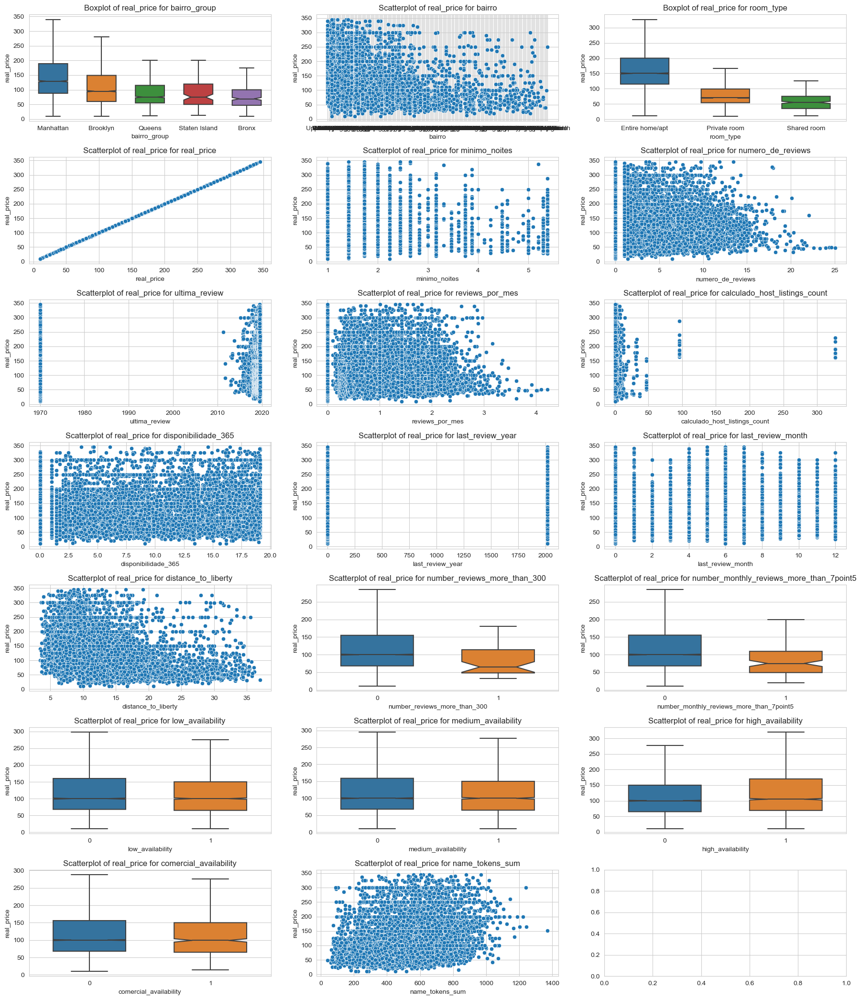

In [89]:
two_var(df_filtered, cols_to_plot2, 'real_price', None)

### Using embbeding to extract more information on the name_tokens

In [90]:
# Modify the TfidfVectorizer to work with pre-tokenized text
vectorizer = TfidfVectorizer(tokenizer=lambda x: x, lowercase=False, preprocessor=lambda x: x)

# Convert the 'name_tokens' lists to TF-IDF vectors
tfidf_matrix = vectorizer.fit_transform(df_filtered['name_tokens'])

# Convert the TF-IDF matrix to a DataFrame
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=vectorizer.get_feature_names_out())

# Concatenate the TF-IDF features with your original DataFrame
df_filtered = pd.concat([df_filtered.reset_index(drop=True), tfidf_df], axis=1)

C:\Users\vinic\anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



## EDA Final conclusions

- After an extensive analysis of every variable, we applied several filters to ensure data quality, and created several new features, based on the given variables.
- Neighborhood, location and room_type showed to be highly correlated with listing's prices. 
- The higher the number of reviews and monthly reviews, the lower the price. This suggests that the cheaper the listing, more booked it will be.
- The higher average price neighborhood is Tribeca in Manhattan.
- Looking the listings prices in the map, it could be said that the prices range accordingly to the distance of specific places, such as the statue of liberty (close to the most noble area in Manhattan).
- Listings with newer 'last_reviews' tends to be more expensive.
- The higher the minimum nights, the lower the prices tends to be. Only listings with minimal up to 30 days were considered, since NY law states that more than 30 days it is long-term rental, and the website focus is short term rentals.
- The high number of listing per host_id suggested that many realtors or companies (such as hotel franchises) used the website.
- Availability is not clealy correlated with price, however, after separating the availability in levels, there were a significant difference in prices (calculated by anova).

## 6. Predictive Models

Before fitting statistical models to the data, we need to handle the categorical variables and split the data into train and test datasets.

#### Testing a more extrict threshold in price range to evaluate the models

In [91]:
df_filtered.shape

(11506, 2056)

#### One-hot-encoding

In [92]:
#Exclude the columns that will not be used for modeling, such as id, name, host_id, last_review (will be used the month and year), and name_tokens (name_tokens_sum will be used)
df_filtered = df_filtered.drop(['id', 'nome', 'host_id', 'ultima_review', 'name_tokens'], axis='columns')

#Encode the categorical variables
room_type_encoding = pd.get_dummies(df_filtered['room_type'], prefix='Is_room_type')
df_filtered = pd.concat([df_filtered, room_type_encoding], axis='columns')
df_filtered = df_filtered.drop(['room_type'], axis='columns')


bairro_group_encoding = pd.get_dummies(df_filtered['bairro_group'], prefix='Is_group')
bairro_encoding = pd.get_dummies(df_filtered['bairro'], prefix='Is_bairro')
df_filtered = pd.concat([df_filtered, bairro_group_encoding, bairro_encoding], axis='columns')
df_filtered = df_filtered.drop(['bairro_group', 'bairro'], axis='columns')

df_filtered.rename(columns=lambda x: x.replace(' ', '_'), inplace=True)

In [93]:
non_numerical_columns = df_filtered.select_dtypes(exclude=['number']).columns

if len(non_numerical_columns) > 0:
    print(f"The following columns are not numerical: {', '.join(non_numerical_columns)}")
else:
    print("All columns are numerical.")

All columns are numerical.


In [94]:
df_filtered.shape

(11506, 2261)

#### Evaluation Metrics

In [95]:
model_metrics = {} # dict to append all the models metrics
#the functions to get the metrics are in the 3. Defined Functions

#### Data-Split

In [96]:
x = df_filtered.drop(['real_price'], axis = 1)
y = df_filtered['real_price']

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=44)

#### Features Scaling

In [97]:
scaler = StandardScaler()

columns_to_scale = [col for col in X_train.columns if X_train[col].nunique(dropna=True) > 2]

X_train[columns_to_scale] = scaler.fit_transform(X_train[columns_to_scale])

X_test[columns_to_scale] = scaler.transform(X_test[columns_to_scale])

In [98]:
X_train.shape

(8054, 2260)

#### Naive Model

{'MSE': 4567.15, 'RMSE': 67.58, 'MAE': 54.44, 'MAPE': 45.0, 'r2': -0.0}


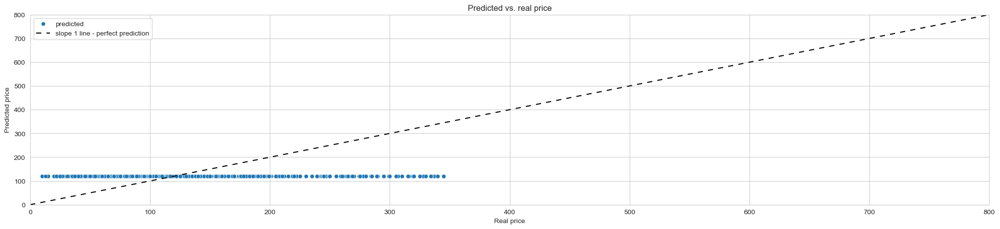

In [99]:
dummy_regr = DummyRegressor(strategy='mean')
dummy_regr.fit(X_train, y_train)
model_metrics['naive_model']= metrics(dummy_regr)
print(metrics(dummy_regr))
plot_result(dummy_regr)

#### Linear Regression

{'MSE': 2.0533755130356275e+29, 'RMSE': 453141866641742.5, 'MAE': 19185948782349.28, 'MAPE': 15857864463690.56, 'r2': -4.499379380043401e+25}


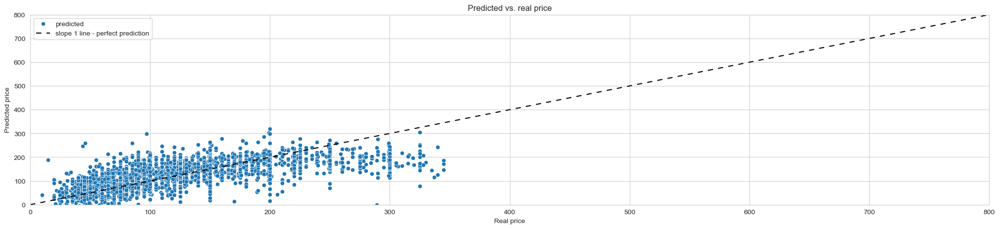

In [100]:
model_lr = LinearRegression()
model_lr.fit(X_train, y_train)
model_metrics['Linear_regression'] = metrics(model_lr)
print(metrics(model_lr))
plot_result(model_lr)

#### Random Forest

{'MSE': 2010.57, 'RMSE': 44.84, 'MAE': 32.23, 'MAPE': 26.64, 'r2': 0.56}


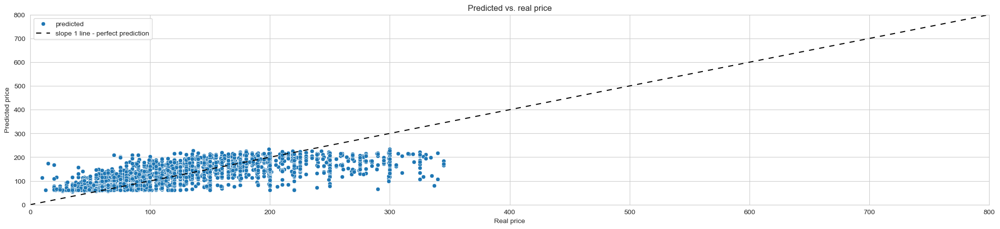

In [101]:
model_rf = RandomForestRegressor(n_estimators=100, max_depth=8, random_state=42)
model_rf.fit(X_train, y_train)
model_metrics['Random_forest'] = metrics(model_rf)
print(metrics(model_rf))
plot_result(model_rf)

#### XGBoost

{'MSE': 1913.91, 'RMSE': 43.75, 'MAE': 31.36, 'MAPE': 25.92, 'r2': 0.58}


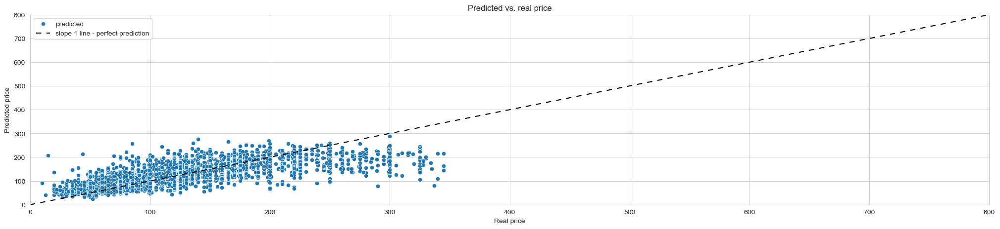

In [102]:
model_xgb = XGBRegressor()
model_xgb.fit(X_train, y_train)
model_metrics['XGBoost'] = metrics(model_xgb)
print(metrics(model_xgb))
plot_result(model_xgb)

#### Lasso Regression

{'MSE': 2094.04, 'RMSE': 45.76, 'MAE': 33.4, 'MAPE': 27.61, 'r2': 0.54}


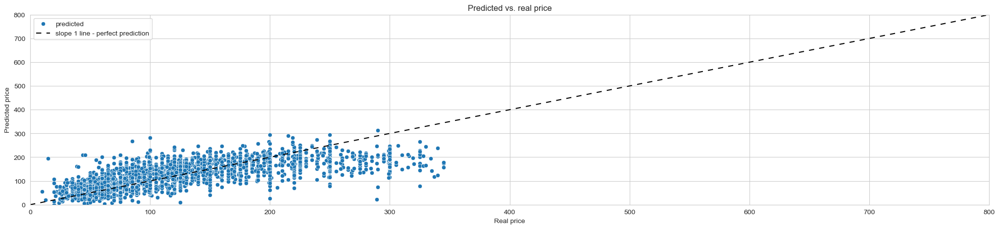

In [103]:
lasso_model = Lasso(alpha=0.01)
lasso_model.fit(X_train, y_train)
model_metrics['LASSO'] = metrics(lasso_model)
print(metrics(lasso_model))
plot_result(lasso_model)

#### LightGBM

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11861
[LightGBM] [Info] Number of data points in the train set: 8054, number of used features: 318
[LightGBM] [Info] Start training from score 119.124907
{'MSE': 1846.85, 'RMSE': 42.97, 'MAE': 30.79, 'MAPE': 25.45, 'r2': 0.6}


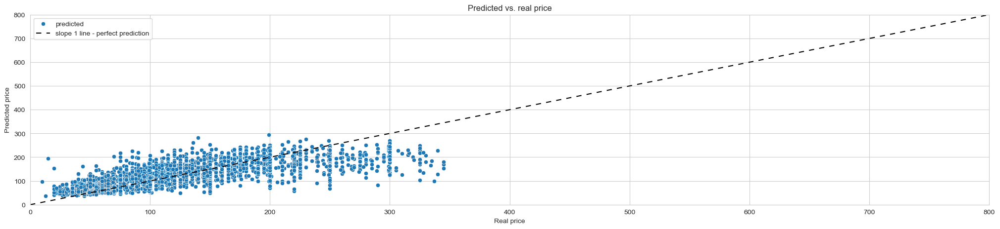

In [104]:
model_ltb = ltb.LGBMRegressor()
model_ltb.fit(X_train, y_train)
model_metrics['LightGBM'] = metrics(model_ltb)
print(metrics(model_ltb))
plot_result(model_ltb)

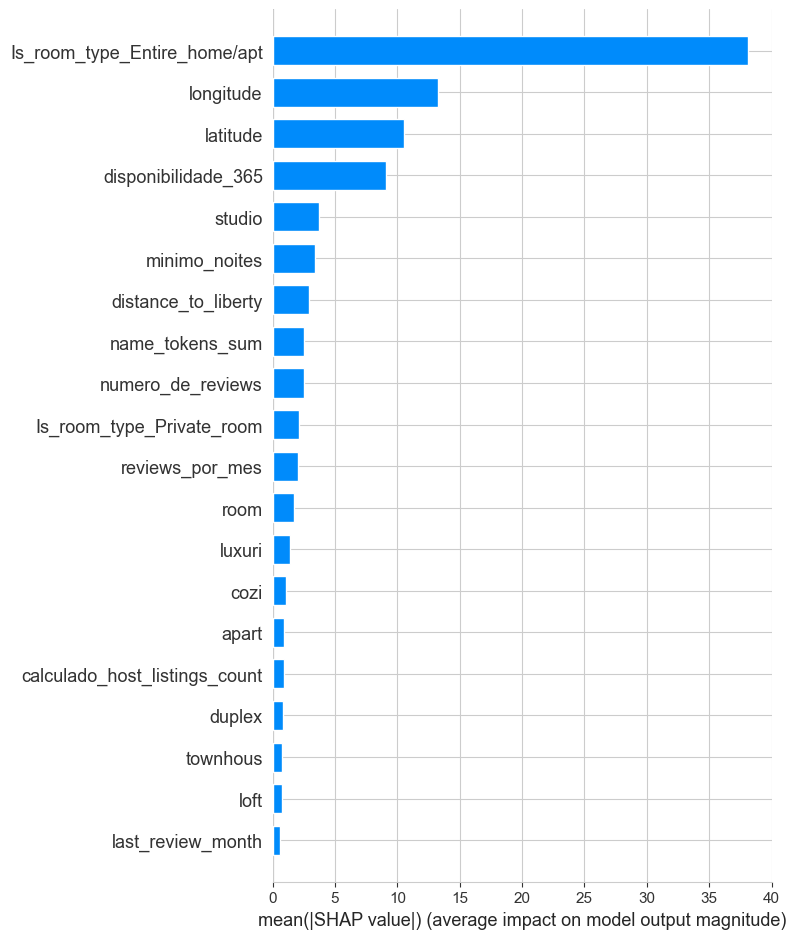

In [105]:
#Feature importance
explainer = shap.TreeExplainer(model_ltb)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test, plot_type='bar', feature_names=X_test.columns.tolist())

#### Models overview

In [107]:
models_df = pd.DataFrame(model_metrics)
models_df

,naive_model,Linear_regression,Random_forest,XGBoost,LASSO,LightGBM
MSE,4567.15,205337551303562746423465213952.00,2010.57,1913.91,2094.04,1846.85
RMSE,67.58,453141866641742.50,44.84,43.75,45.76,42.97
MAE,54.44,19185948782349.28,32.23,31.36,33.40,30.79
MAPE,45.00,15857864463690.56,26.64,25.92,27.61,25.45
r2,-0.00,-44993793800434012221603840.00,0.56,0.58,0.54,0.60


## Pickle file

In [110]:
#saving the model:

filename = "Listing_prices_ViniciusFerreira.pkl"
with open(filename, 'wb') as file:
  pickle.dump(model_ltb, file)

In [111]:
#for loading the model in the future, we can use:

with open ('Listing_prices_ViniciusFerreira.pkl', 'rb') as f:
  model = pickle.load(f)

## 7. Conclusion

- Considering the generated features and models, the best predictive model was LightGBM, with a RMSE of 41.8, and MAPE of 25.5%.

- The generated LightGBM model is still not very precise, but further analysis can be done to improve it, such as: a) remove not important features, b) test other data transformations, c)instead of excluding the high prices listings, we could handle the discrepancies with windsoring, d) tune the hyperparameters of the best model, e) apply Neural Network models on the data, f) consider to exclude all the listings with 0 availability, g) consider to use different models for each neighborhood_group.

- The model decresed the MAPE error in aprox. 20% comparing to the naive model.

## 8. Config and pre_process functions

In [128]:
def read_and_preprocess(file_path):
    df = pd.read_csv(file_path)
    
    df = df.rename(columns={'price': 'real_price'})
    df['ultima_review'] = pd.to_datetime(df['ultima_review']) # Converting the dates to datetime format
    df['last_review_year'] = df['ultima_review'].dt.year
    df['last_review_month'] = df['ultima_review'].dt.month
    
    # Applying the initial filters
    df = df[df['real_price'] != 0]
    df = df[df['nome'].notna()]
    df = df[df['host_name'].notna()]
    df = df.drop('host_name', axis=1)

    # Handling NaN values
    columns_to_fill_zero = ['ultima_review', 'reviews_por_mes', 'last_review_year', 'last_review_month']
    df[columns_to_fill_zero] = df[columns_to_fill_zero].fillna(0)
    
    df = df[df['minimo_noites'] < 30]
    
    # Statue of Liberty distance calculation
    target_latitude, target_longitude = 40.68924, -74.04454
    df['distance_to_liberty'] = df.apply(lambda row: simple_distance(row['latitude'], row['longitude'], target_latitude, target_longitude), axis=1)

    df = df[df['reviews_por_mes'] < 20]
    
    df['number_reviews_more_than_300'] = (df['numero_de_reviews'] >= 300).astype(int)
    df['number_monthly_reviews_more_than_7point5'] = (df['reviews_por_mes'] >= 7.5).astype(int)
    
    df['low_availability'] = (df['disponibilidade_365'] <= 15).astype(int)
    df['medium_availability'] = ((df['disponibilidade_365'] > 15) & (df['disponibilidade_365'] <= 90)).astype(int)
    df['high_availability'] = ((df['disponibilidade_365'] > 90) & (df['disponibilidade_365'] <= 350)).astype(int)
    df['comercial_availability'] = (df['disponibilidade_365'] > 350).astype(int)
    
    # Applying a function to detect and exclude special characters and non-English words
    mask = df['nome'].apply(detect_english_and_special)
    df = df[mask]
    
    # Apply preprocessing to 'nome' column
    df['name_tokens'] = df['nome'].apply(preprocess_text)
    
    # Create a set of unique words from all listings
    all_words = set()
    for tokens in df['name_tokens']:
        all_words.update(tokens)
    
    # Create a dictionary to store the sum of prices and count for each word
    word_sum_prices = {word: {'sum': 0, 'count': 0} for word in all_words}
    
    # Calculate the sum of prices and count for each word
    for index, row in df.iterrows():
        for word in row['name_tokens']:
            word_sum_prices[word]['sum'] += row['real_price']
            word_sum_prices[word]['count'] += 1
    
    # Filter out words with count less than 3
    word_sum_prices = {word: value for word, value in word_sum_prices.items() if value['count'] >= 3}
    
    # Calculate the average price for each word
    word_avg_prices = {word: value['sum'] / value['count'] for word, value in word_sum_prices.items() if value['count'] > 0}
    
    def calculate_token_sum(tokens):
        return sum(word_avg_prices.get(token, 0) for token in tokens)
    
    df['name_tokens_sum'] = df['name_tokens'].apply(calculate_token_sum)
    df = df[df['name_tokens_sum'] > 1]
    
    # Log transformation for data
    features = ['minimo_noites', 'numero_de_reviews', 'reviews_por_mes', 'disponibilidade_365']
    for feature in features:
        df[feature] = df[feature].apply(np.sqrt)
    
    # Modify the TfidfVectorizer to work with pre-tokenized text
    vectorizer = TfidfVectorizer(tokenizer=lambda x: x, lowercase=False, preprocessor=lambda x: x)
    tfidf_matrix = vectorizer.fit_transform(df['name_tokens'])
    tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=vectorizer.get_feature_names_out())
    df = pd.concat([df.reset_index(drop=True), tfidf_df], axis=1)
    
    # Exclude the columns that will not be used for modeling
    df = df.drop(['id', 'nome', 'host_id', 'ultima_review', 'name_tokens'], axis='columns')
    
    # Encode the categorical variables
    room_type_encoding = pd.get_dummies(df['room_type'], prefix='Is_room_type')
    df = pd.concat([df, room_type_encoding], axis='columns').drop(['room_type'], axis='columns')
    
    bairro_group_encoding = pd.get_dummies(df['bairro_group'], prefix='Is_group')
    bairro_encoding = pd.get_dummies(df['bairro'], prefix='Is_bairro')
    df = pd.concat([df, bairro_group_encoding, bairro_encoding], axis='columns').drop(['bairro_group', 'bairro'], axis='columns')
    
    df.rename(columns=lambda x: x.replace(' ', '_'), inplace=True)
    
    return df


In [134]:
def split_and_scaling(df):
    x = df_filtered.drop(['real_price'], axis = 1)
    y = df_filtered['real_price']

    X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=44)

    scaler = StandardScaler()

    columns_to_scale = [col for col in X_train.columns if X_train[col].nunique(dropna=True) > 2]

    X_train[columns_to_scale] = scaler.fit_transform(X_train[columns_to_scale])

    X_test[columns_to_scale] = scaler.transform(X_test[columns_to_scale])

def model_fit(df):
    model_ltb = ltb.LGBMRegressor()
    model_ltb.fit(X_train, y_train)

    with open(f"{filename}.pkl", 'wb') as file:
        pickle.dump(model_ltb, file)
    
    print(f"Model saved to {filename}.pkl")

In [129]:
file_path = r'F:\Ferreira.v.g - 06_06_2023\Inscrições trabalhos\Inscrição Indicium\[LH 2024-4] Desafio de Ciência de Dados\teste_indicium_precificacao.csv'
df1 = read_and_preprocess(file_path)

C:\Users\vinic\anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



In [135]:
split_and_scaling(df1)
model_fit(df)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11861
[LightGBM] [Info] Number of data points in the train set: 8054, number of used features: 318
[LightGBM] [Info] Start training from score 119.124907
Model saved to Listing_prices_ViniciusFerreira.pkl.pkl


## 9. Predicting given sample

In [136]:
#Given sample
sample = {
    'id': 2595,
    'nome': 'Skylit Midtown Castle',
    'host_id': 2845,
    'host_name': 'Jennifer',
    'bairro_group': 'Manhattan',
    'bairro': 'Midtown',
    'latitude': 40.75362,
    'longitude': -73.98377,
    'room_type': 'Entire home/apt',
    'price': 225,
    'minimo_noites': 1,
    'numero_de_reviews': 45,
    'ultima_review': '2019-05-21',
    'reviews_por_mes': 0.38,
    'calculado_host_listings_count': 2,
    'disponibilidade_365': 355
}
df_sample = pd.DataFrame([sample])


#### In order to predict a single sample, the code must be changed, for example we need to sabe a file with the word tokens mean values. The way it is, we cannot run a simple read_and_preprocess(path) in the sample, or we will get the wrong value in the feature 'name_token_sum'.

Although the modifications are not highly difficult to perform, the test deadline doesnot allow me to finish.

However, the given sample is present in out trainning dataset (which is not recommended), and the price for this sample is 225 dollars.